In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%reload_ext autoreload

In [3]:
from patient_model import simulate_population, plot_population_trends, plot_distribution_snapshots, plot_correlations, plot_scatter_relations

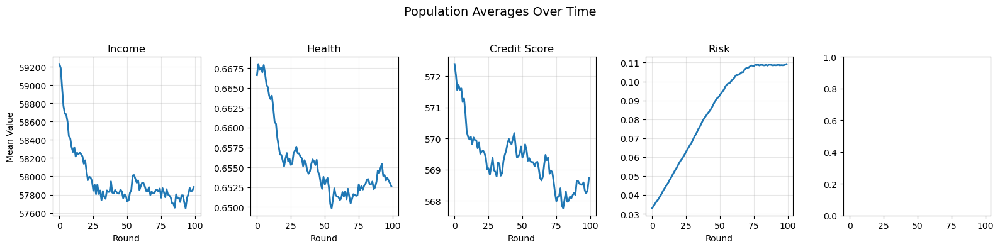

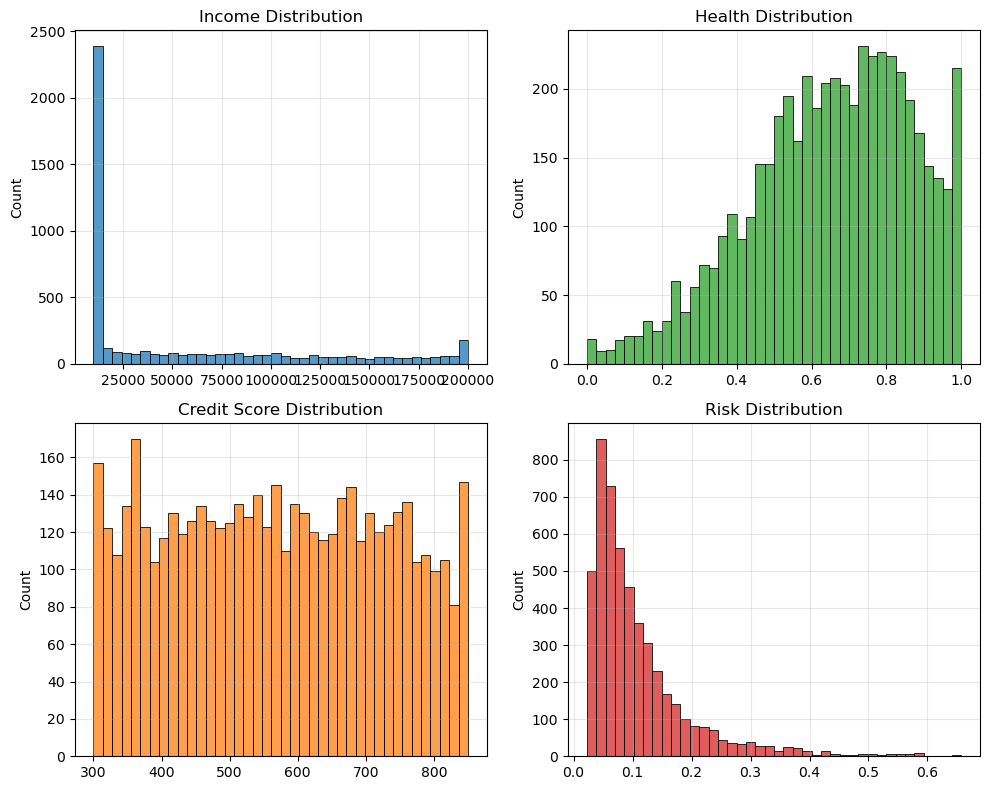

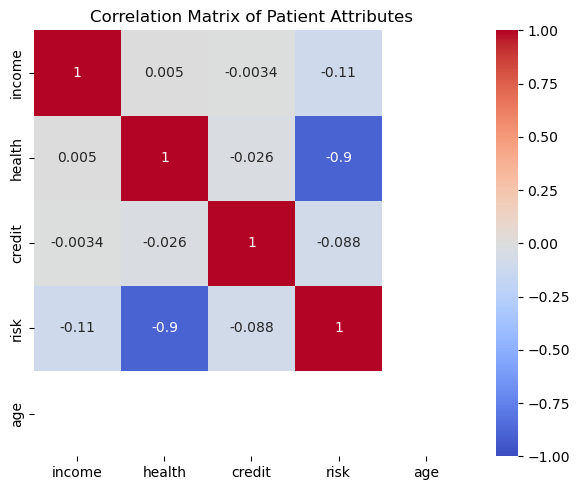

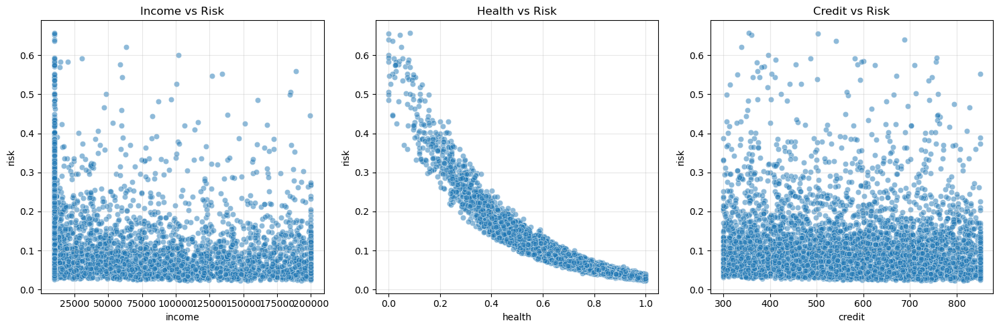

In [4]:
# Simulate 5000 patients for 100 rounds
patients, df = simulate_population(n_patients=5000, n_rounds=100)

# Visualize overall dynamics
plot_population_trends(df)
plot_distribution_snapshots(patients)
plot_correlations(patients)
plot_scatter_relations(patients)

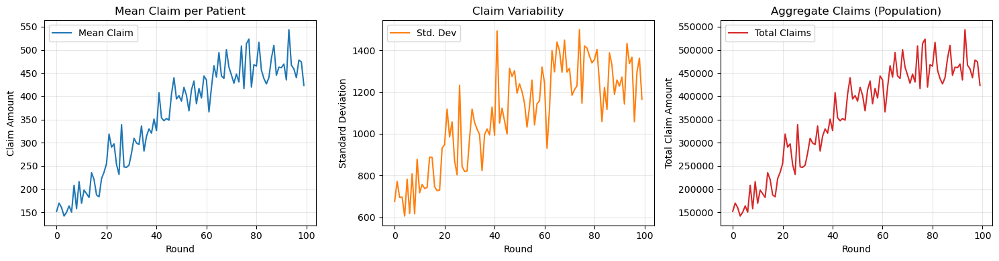

In [4]:
from patient_model import simulate_claims_over_time, plot_claims_evolution

patients, df_claims = simulate_claims_over_time(n_patients=1000, n_rounds=100)
plot_claims_evolution(df_claims)

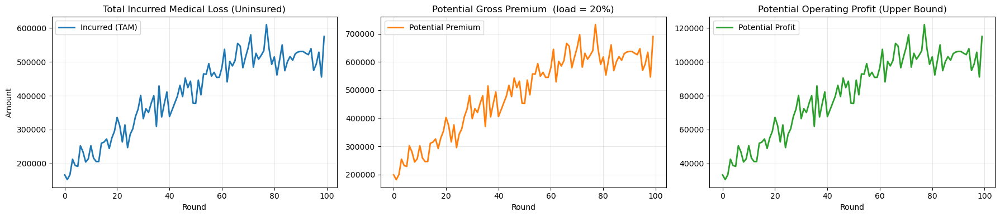

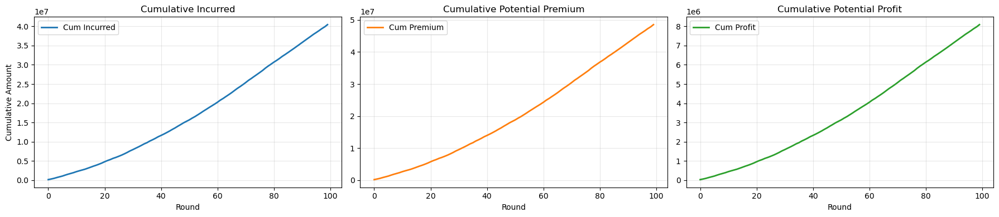

In [5]:
from patient_model import simulate_uninsured_market, plot_uninsured_market_opportunity

patients, df_market = simulate_uninsured_market(
    n_patients=1000, n_rounds=100, seed=123, load=0.2  # 20% load example
)
plot_uninsured_market_opportunity(df_market)

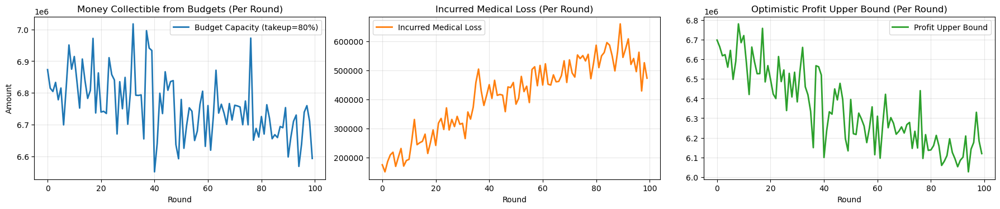

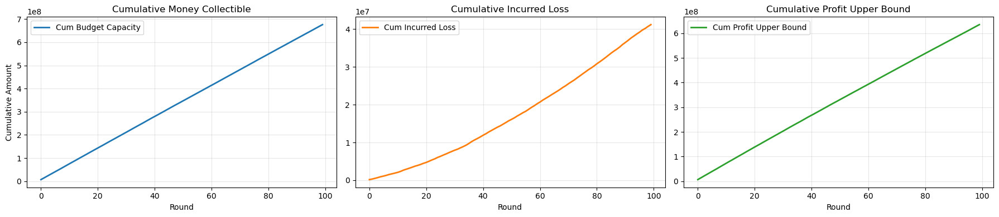

In [6]:
from patient_model import simulate_budget_capacity_market, plot_budget_capacity_market

patients, df_cap = simulate_budget_capacity_market(
    n_patients=1000, n_rounds=100, seed=123, takeup=0.8  # e.g., 80% market adoption
)
plot_budget_capacity_market(df_cap)

## Insurances

In [7]:
from insurance_model import Insurance, FEATURE_KEYS

In [8]:
# Create diverse insurers
ins0 = Insurance(0).set_attitude_profile('neutral')
ins1 = Insurance(1).set_attitude_profile('averse')
ins2 = Insurance(2).set_attitude_profile('seeking')

# Or directly via constructor knobs
ins3 = Insurance(3, margin_price=0.03, risk_load_price=0.5, temp_explore=1.1)

# Offer to a patient observation tensor x (shape [1,5] with FEATURE_KEYS order)
# price, coverage, predicted_risk = ins0.offer_to_patient(x)

In [9]:
from governor_model import Governor, FEATURE_KEYS

In [10]:
%load_ext autoreload
%autoreload 2

from market_model import InsuranceMarket
from insurance_model import Insurance
from governor_model import Governor
from patient_model import Patient  # your evolving patient with risk + claims

# Build a small market
N = 500
patients = [Patient() for _ in range(N)]
insurers = [
    Insurance(0).set_attitude_profile('neutral'),
    Insurance(1).set_attitude_profile('neutral'),
    Insurance(2).set_attitude_profile('neutral'),
    Insurance(3).set_attitude_profile('neutral'),
    Insurance(4).set_attitude_profile('neutral'),
]
governor = Governor(feature_dim=5, hidden=32, lr=1e-2)

market = InsuranceMarket(
    patients=patients,
    insurers=insurers,
    governor=governor,
    initial_assign_pct=0.15,
    lock_in_rounds=5,
    cash_back_rate=0.15,
    fl_every_rounds=5,
    dp_sigma=0.05,
    clip_C=10.0, force_step_pct=0.01 , coverage_target=1.0
)

history = []
for r in range(60):
    stats = market.run_round(round_id=r)
    history.append(stats)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


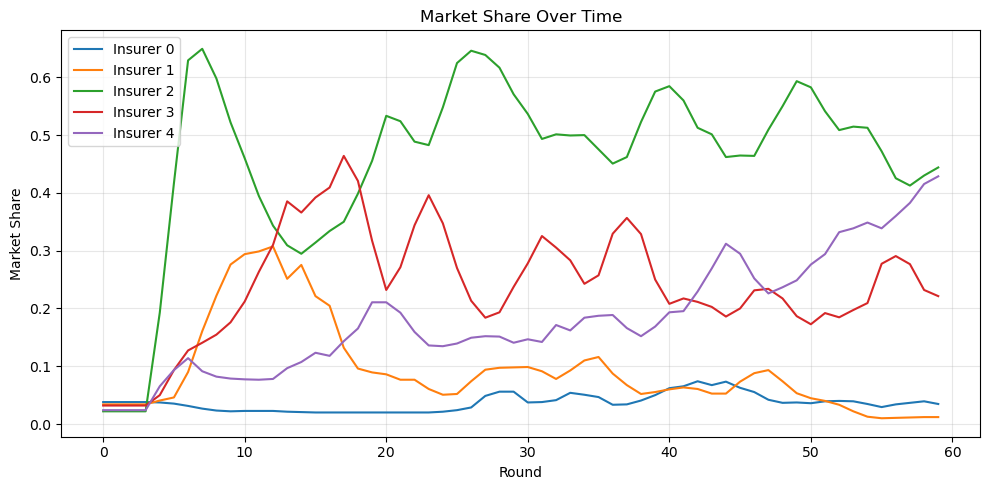

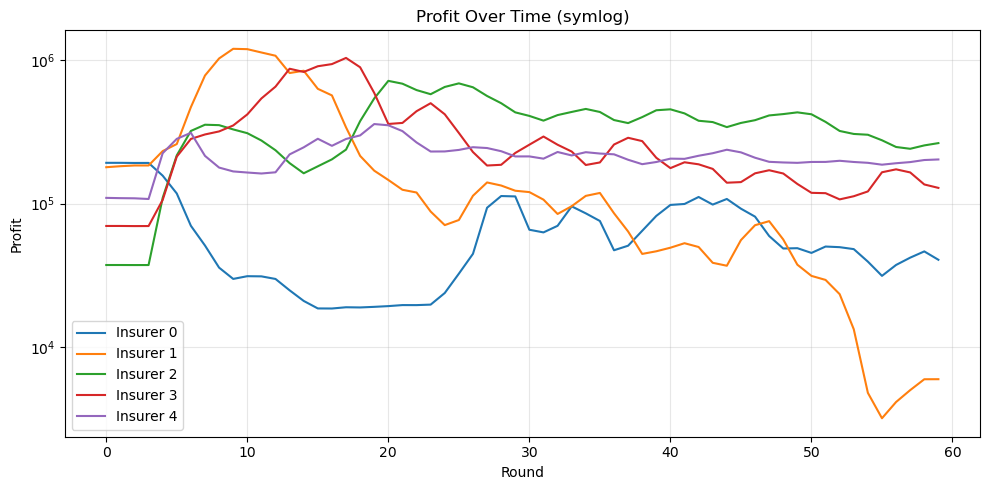

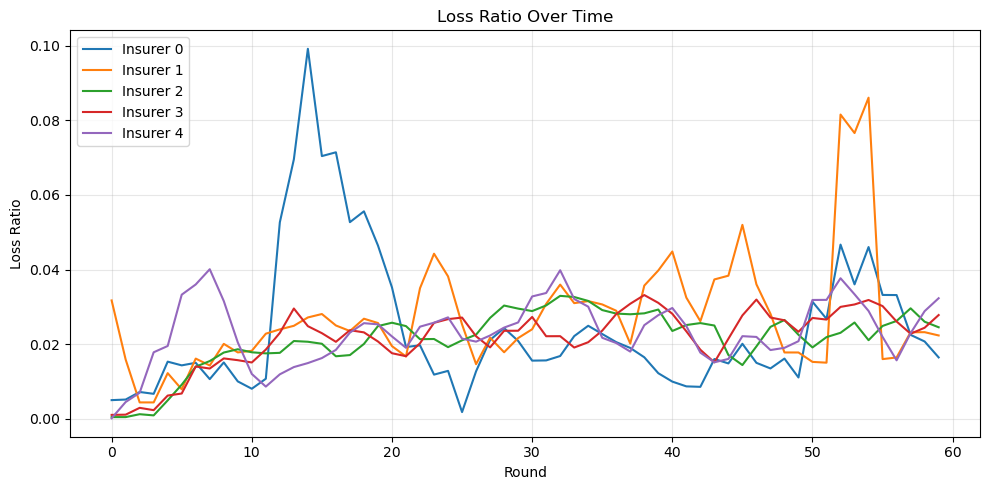

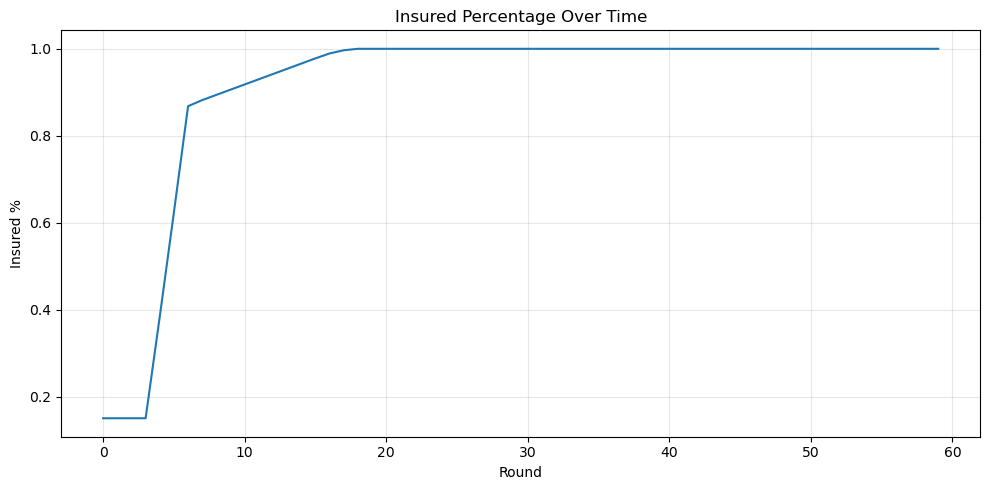

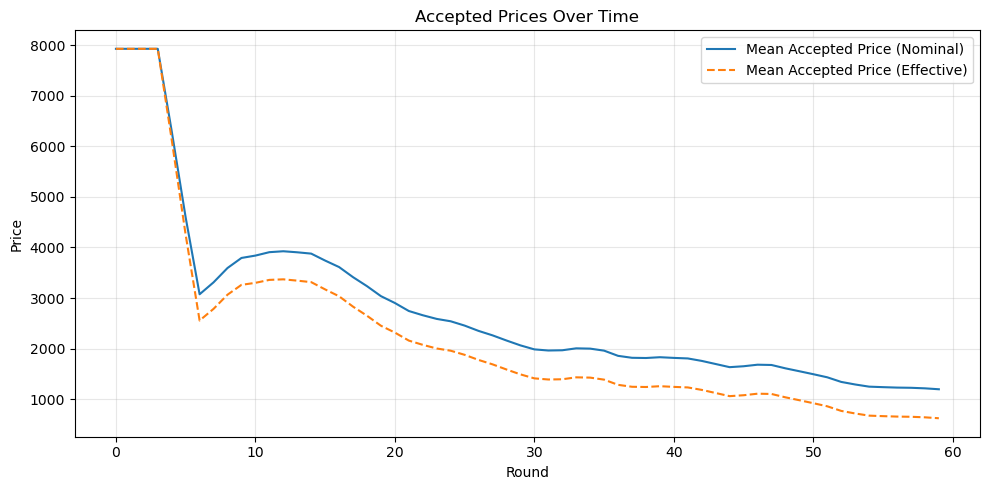

...

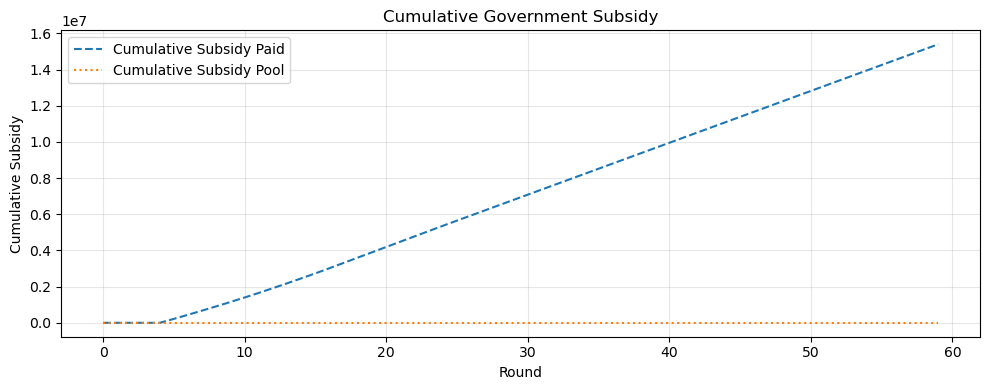

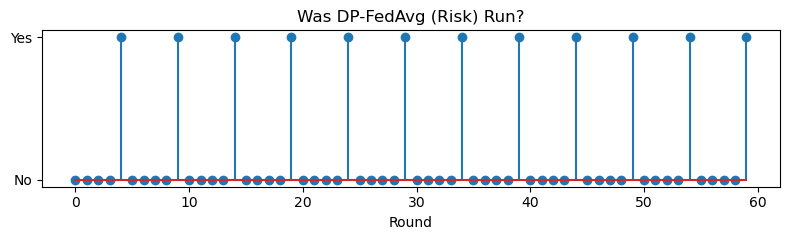

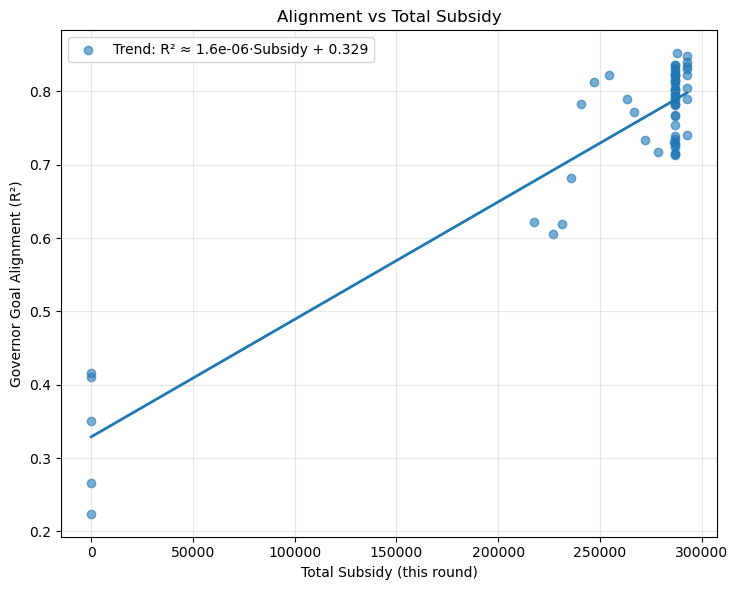

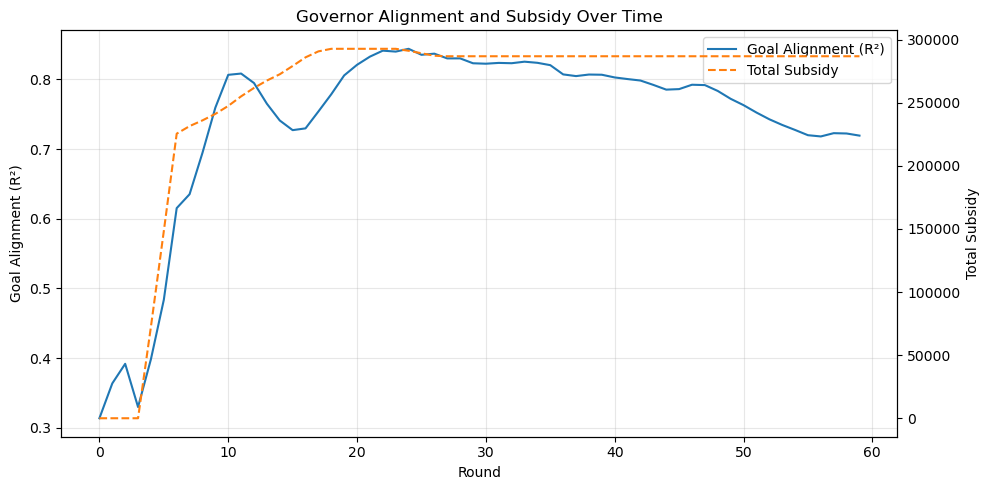

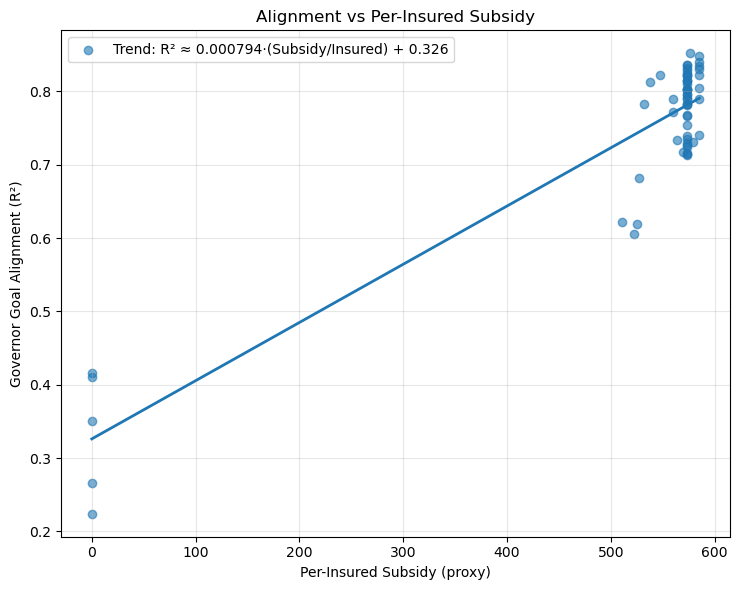

Correlation (R² vs total subsidy): 0.9336373723994823
Correlation (R² vs subsidy per insured): 0.9222906049506132


In [11]:
%load_ext autoreload
%autoreload 2

from market_viz import (
    plot_market_statistics,
    plot_model_losses,
    plot_risk_calibration,
    plot_price_views,
    plot_subsidy_efficiency,
    plot_fl_aggregation_flags,
    plot_governor_alignment_vs_subsidy,
)

# Example:
plot_market_statistics(history, smooth=3)
plot_model_losses(history, smooth=3)
plot_risk_calibration(history)
plot_price_views(history, smooth=3)
plot_subsidy_efficiency(history, smooth=3)
plot_fl_aggregation_flags(history)
plot_governor_alignment_vs_subsidy(history, smooth=3, population_size=len(patients))

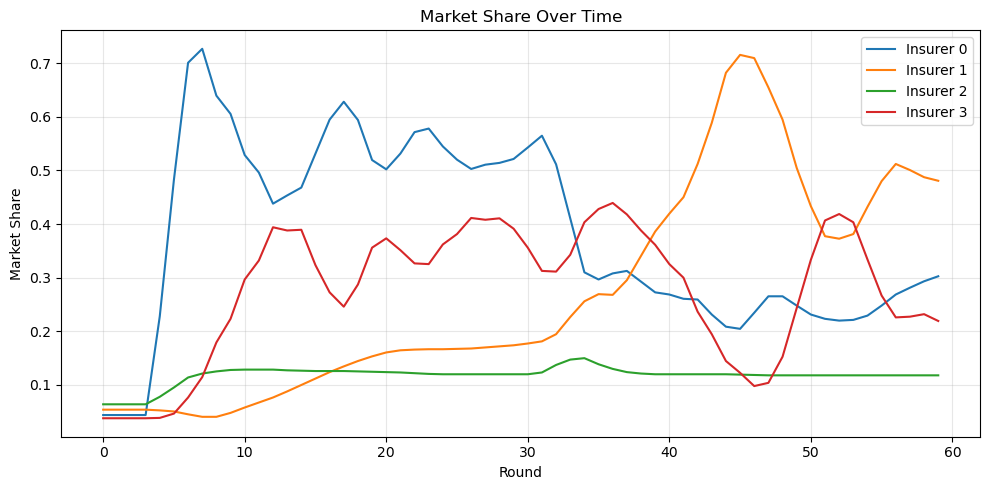

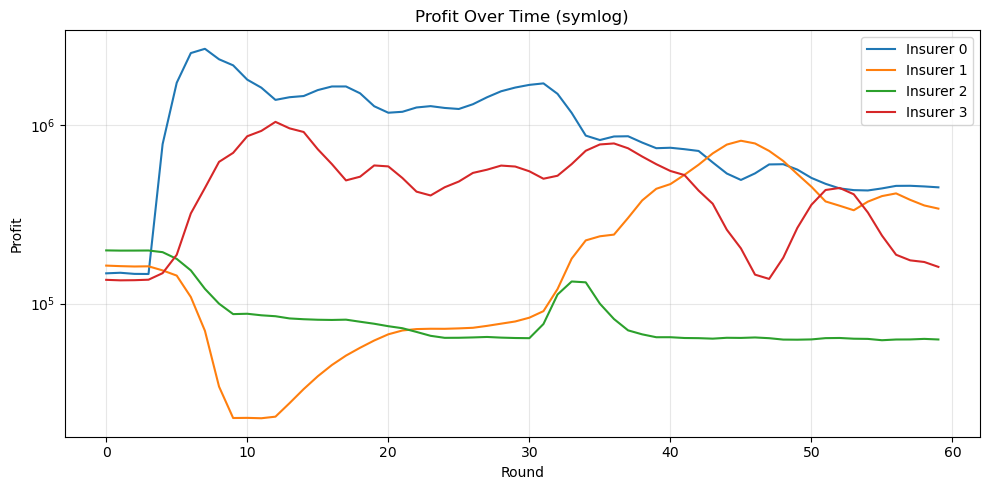

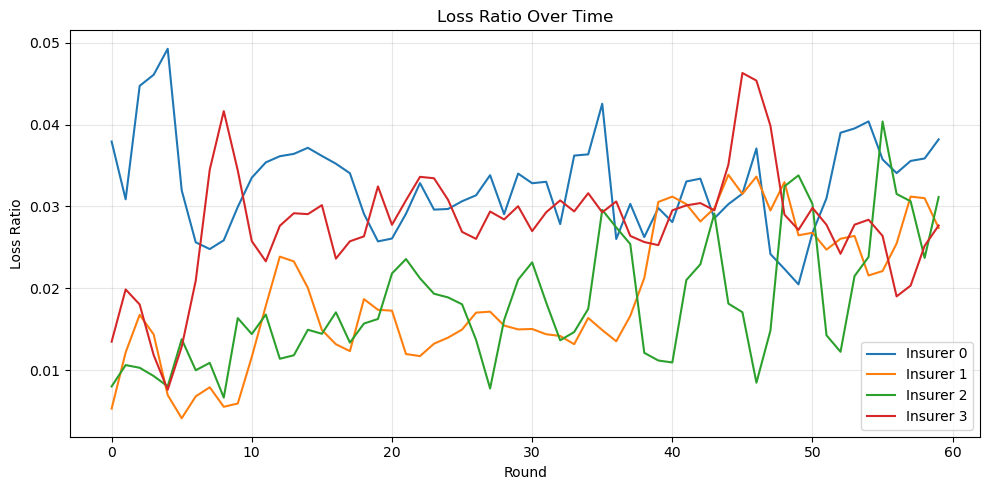

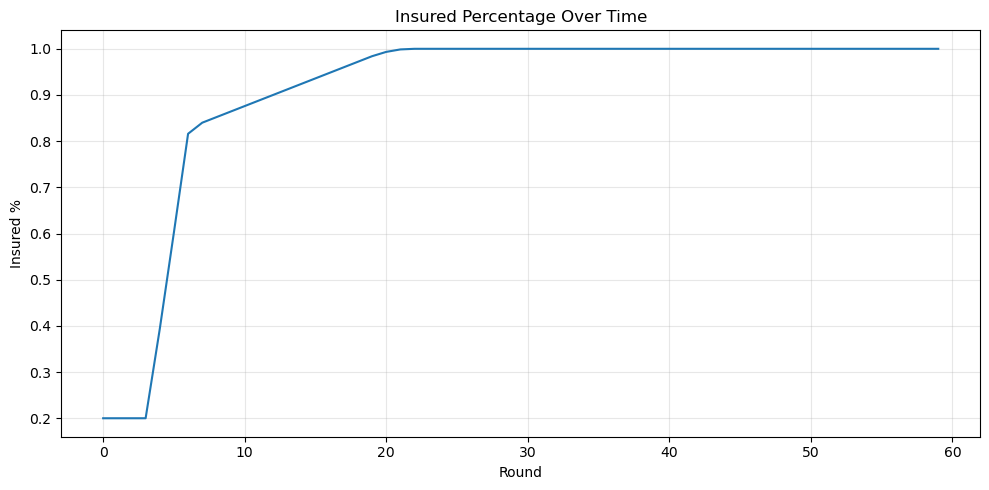

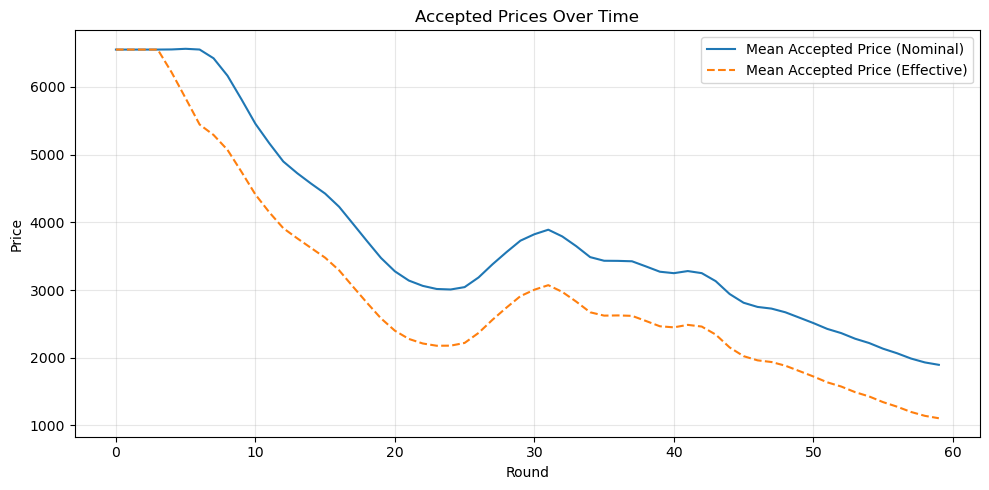

...

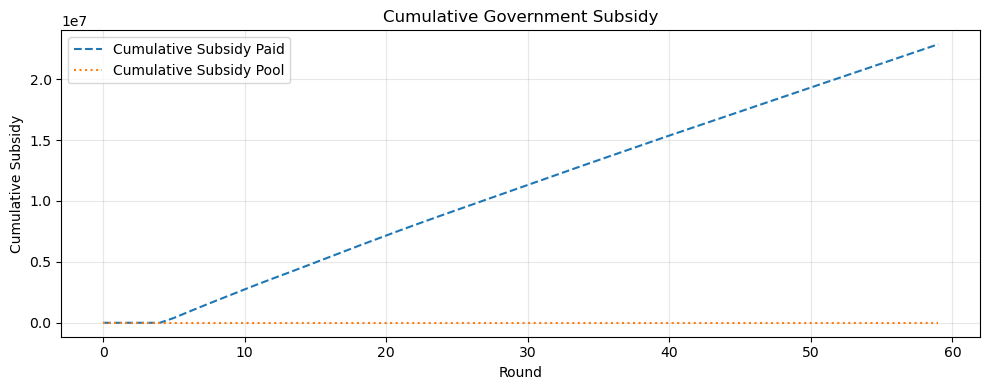

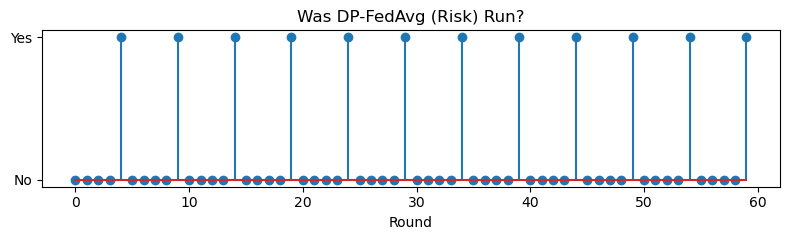

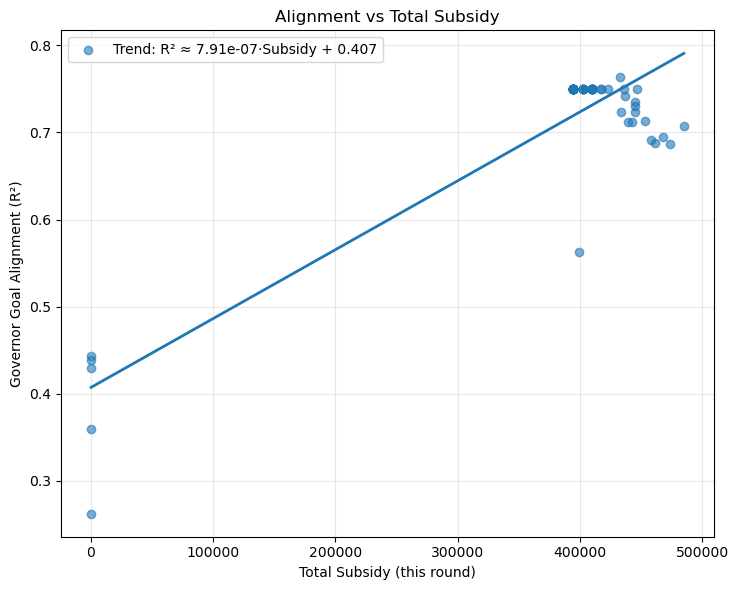

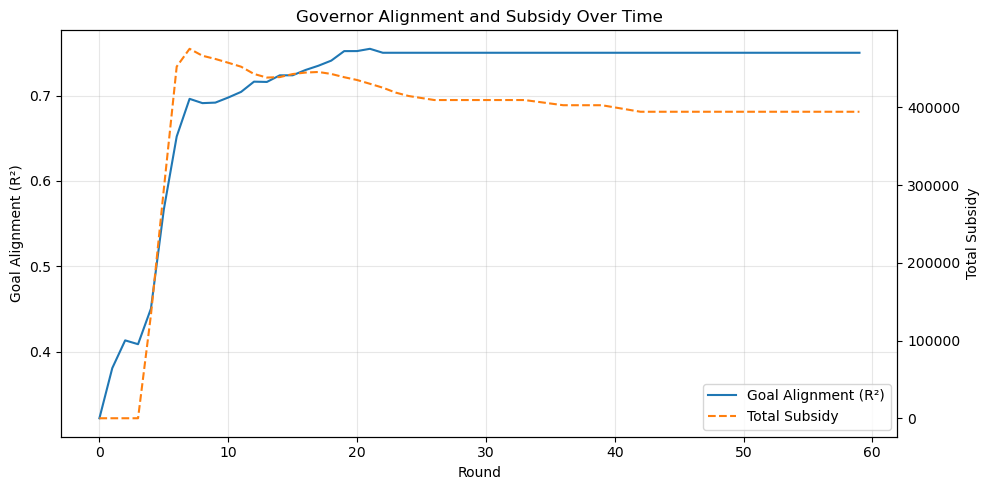

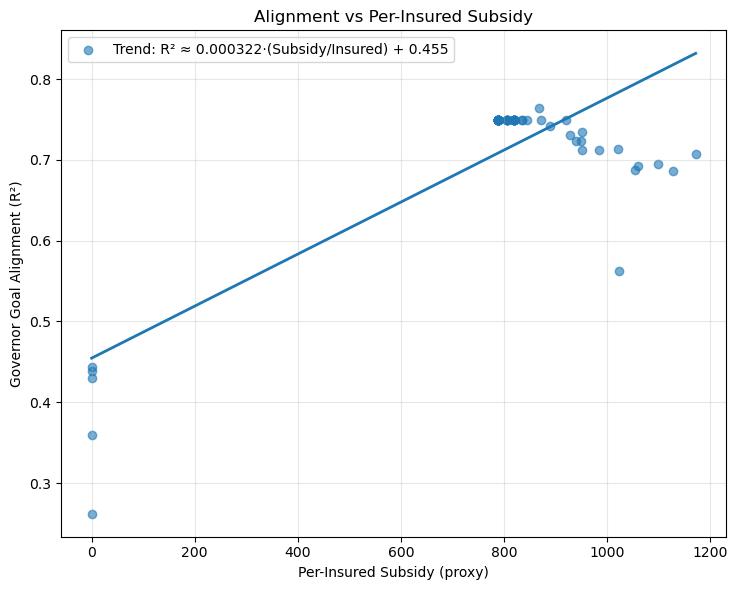

Correlation (R² vs total subsidy): 0.8982426783680584
Correlation (R² vs subsidy per insured): 0.7988047882496307


In [13]:
# Build a small market
N = 500
patients = [Patient() for _ in range(N)]
insurers = [
    Insurance(0).set_attitude_profile('averse'),
    Insurance(1).set_attitude_profile('neutral'),
    Insurance(2).set_attitude_profile('neutral'),
    Insurance(3).set_attitude_profile('neutral'),
]
governor = Governor(feature_dim=5, hidden=32, lr=1e-1)

market = InsuranceMarket(
    patients=patients,
    insurers=insurers,
    governor=governor,
    initial_assign_pct=0.2,
    lock_in_rounds=5,
    cash_back_rate=0.15,
    fl_every_rounds=5,
    dp_sigma=0.05,
    clip_C=10.0 , force_step_pct=0.01 , coverage_target=1.0
)

history = []
for r in range(60):
    stats = market.run_round(round_id=r)
    history.append(stats)

plot_market_statistics(history, smooth=3)
plot_model_losses(history, smooth=3)
plot_risk_calibration(history)
plot_price_views(history, smooth=3)
plot_subsidy_efficiency(history, smooth=3)
plot_fl_aggregation_flags(history)
plot_governor_alignment_vs_subsidy(history, smooth=3, population_size=len(patients))

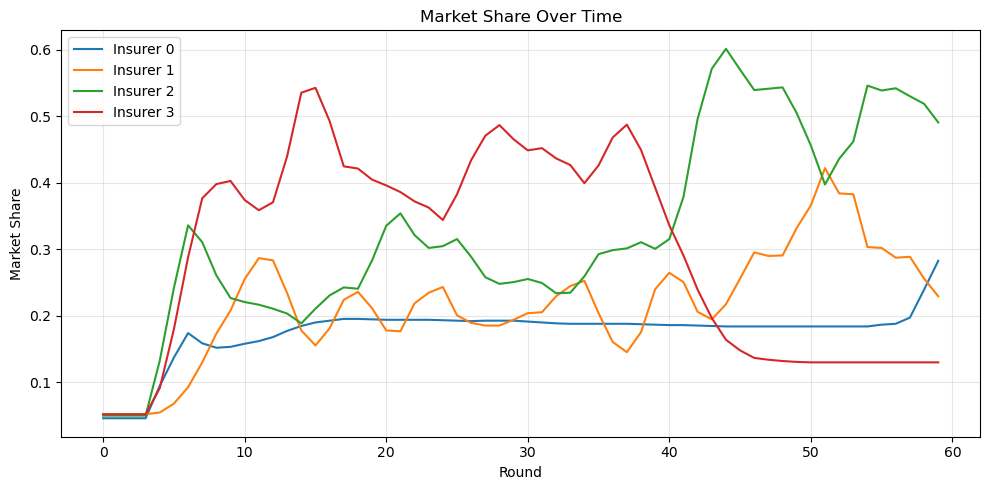

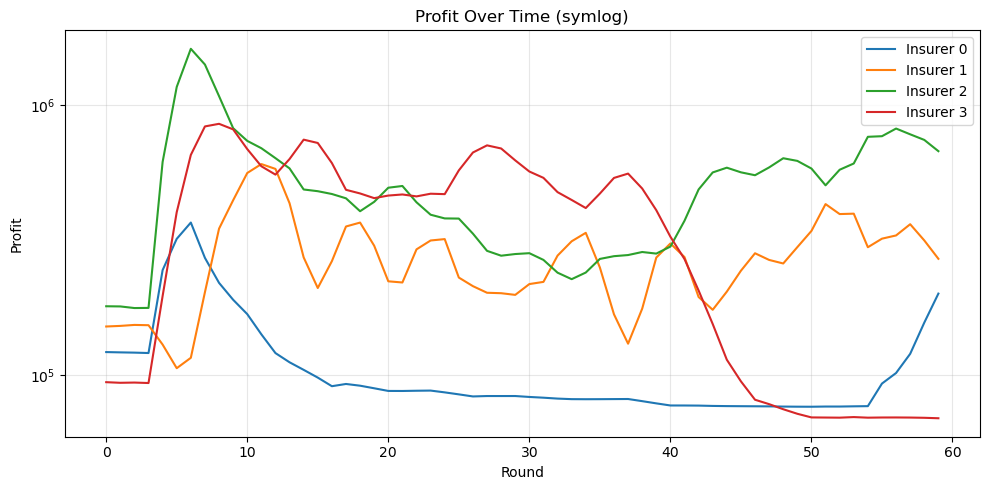

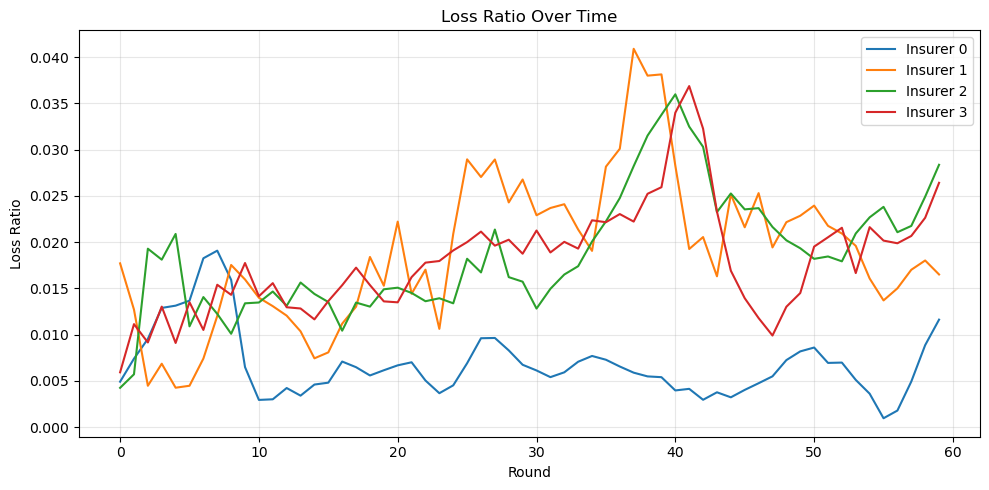

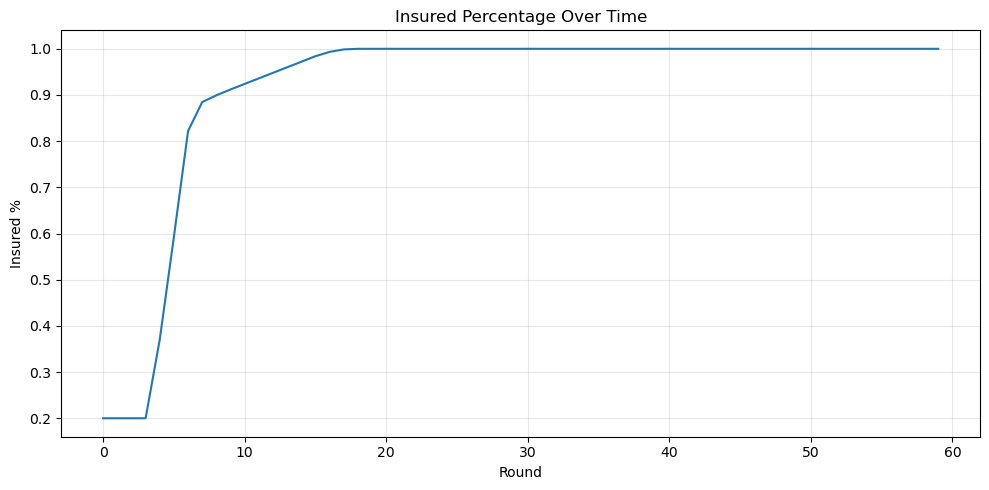

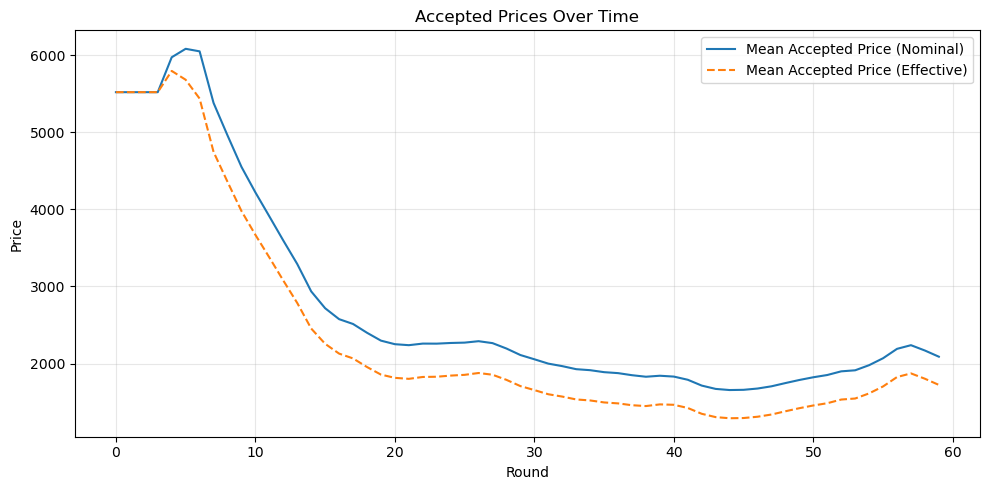

...

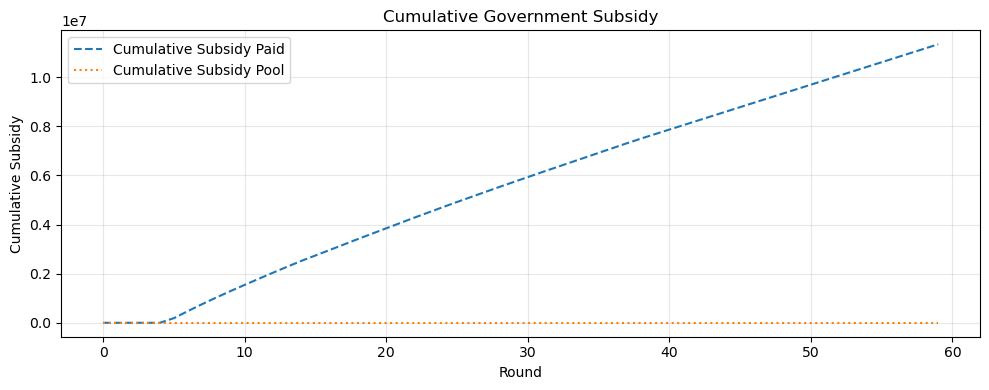

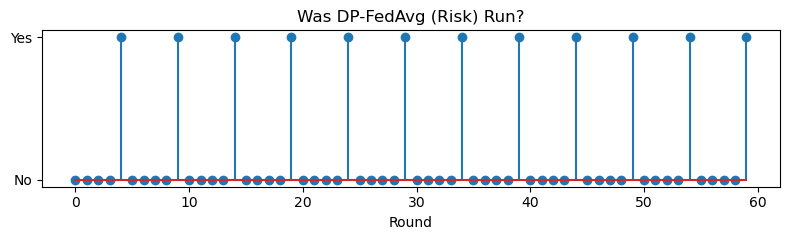

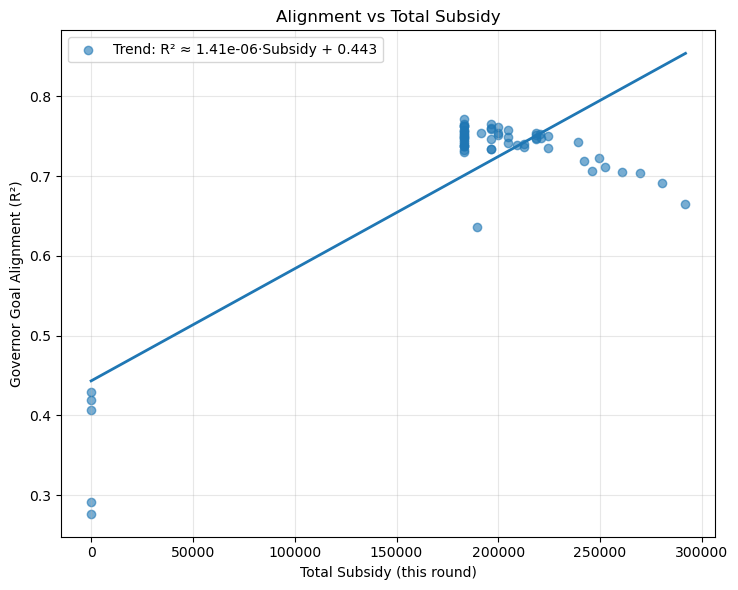

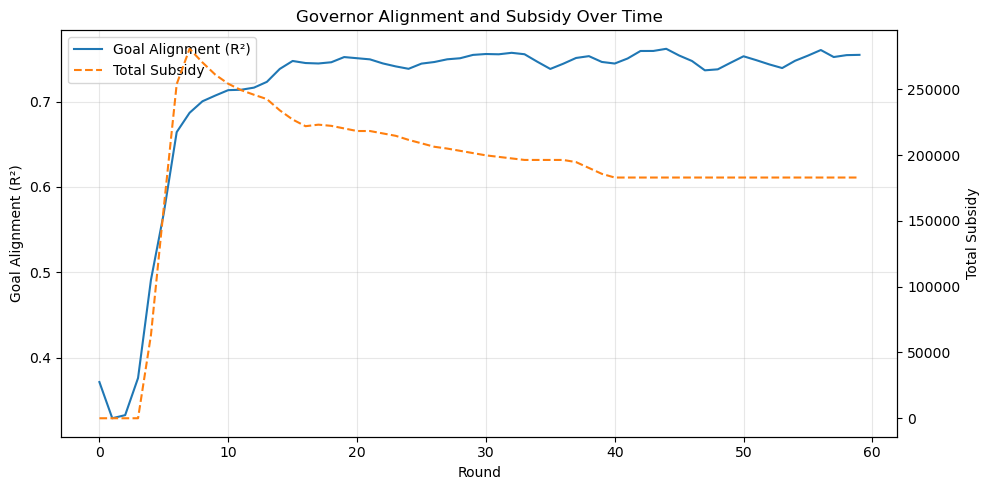

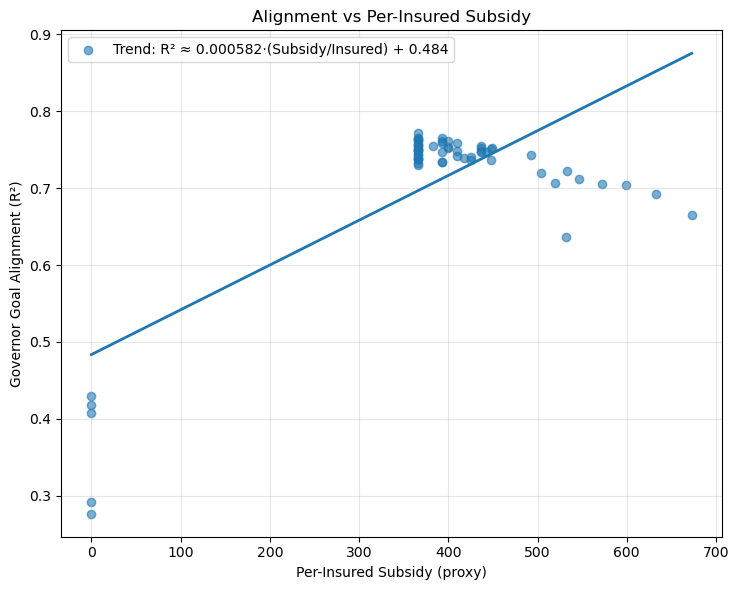

Correlation (R² vs total subsidy): 0.8179798825605635
Correlation (R² vs subsidy per insured): 0.7354944637569485


In [14]:
# Build a small market
N = 500
patients = [Patient() for _ in range(N)]
insurers = [
    Insurance(0).set_attitude_profile('seeking'),
    Insurance(1).set_attitude_profile('neutral'),
    Insurance(2).set_attitude_profile('neutral'),
    Insurance(3).set_attitude_profile('neutral'),
]
governor = Governor(feature_dim=5, hidden=32, lr=1e-1)

market = InsuranceMarket(
    patients=patients,
    insurers=insurers,
    governor=governor,
    initial_assign_pct=0.2,
    lock_in_rounds=5,
    cash_back_rate=0.15,
    fl_every_rounds=5,
    dp_sigma=0.05,
    clip_C=10.0, force_step_pct=0.01 , coverage_target=1.0
)

history = []
for r in range(60):
    stats = market.run_round(round_id=r)
    history.append(stats)

plot_market_statistics(history, smooth=3)
plot_model_losses(history, smooth=3)
plot_risk_calibration(history)
plot_price_views(history, smooth=3)
plot_subsidy_efficiency(history, smooth=3)
plot_fl_aggregation_flags(history)
plot_governor_alignment_vs_subsidy(history, smooth=3, population_size=len(patients))

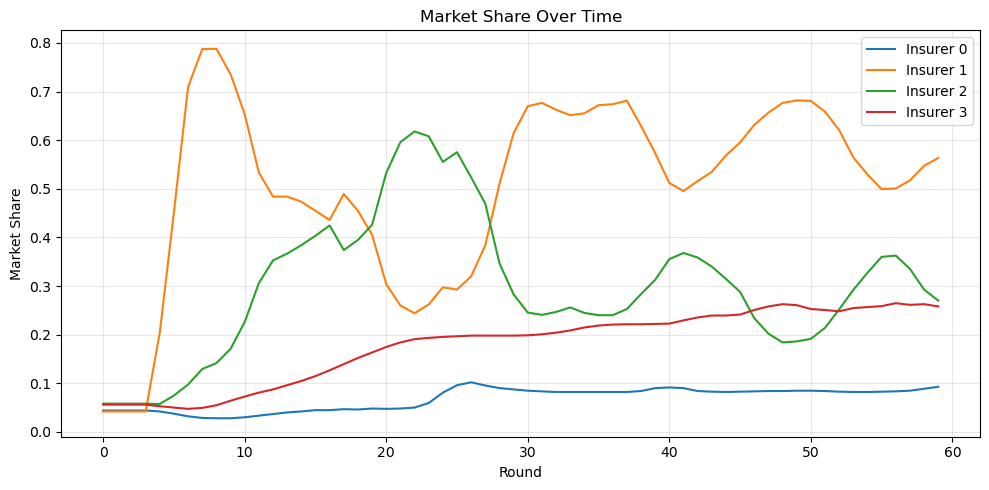

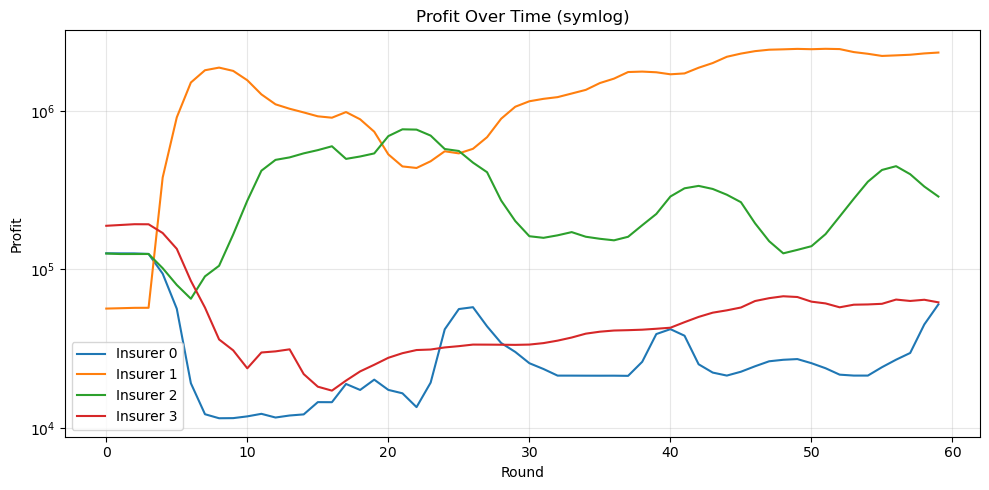

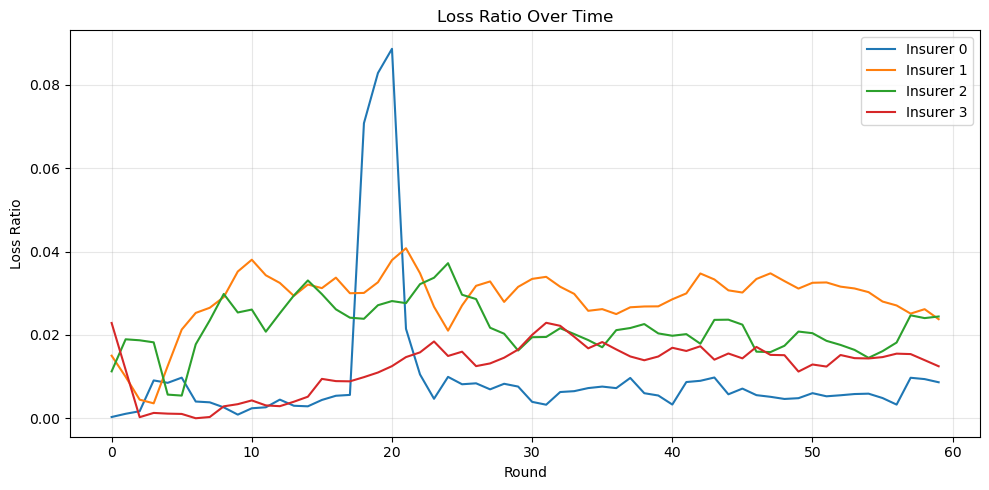

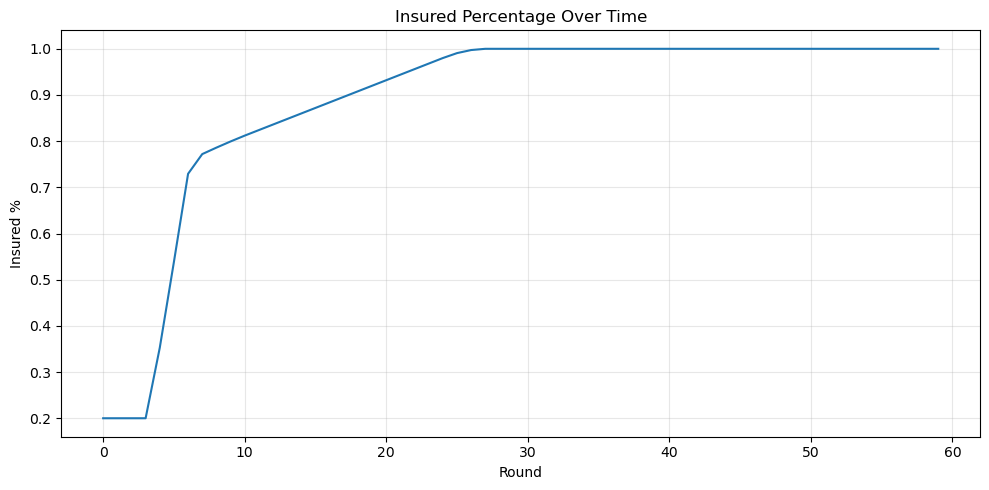

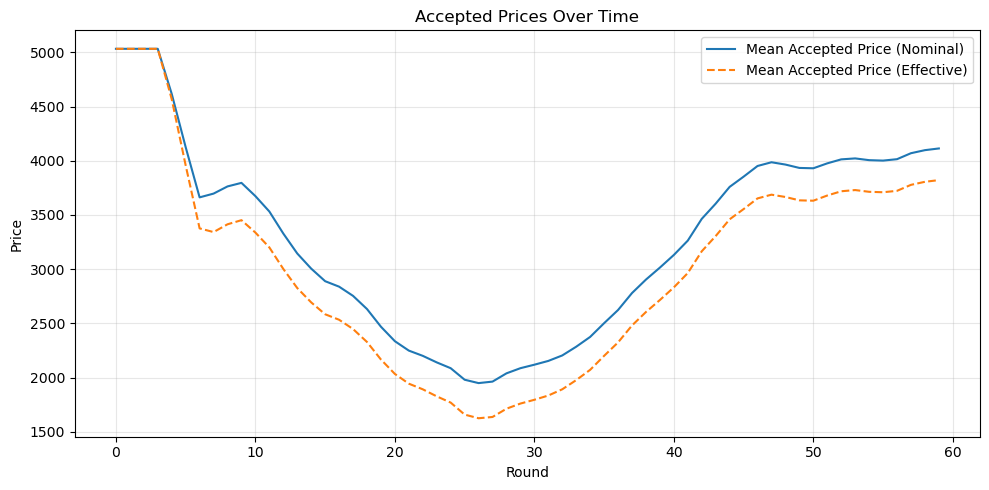

...

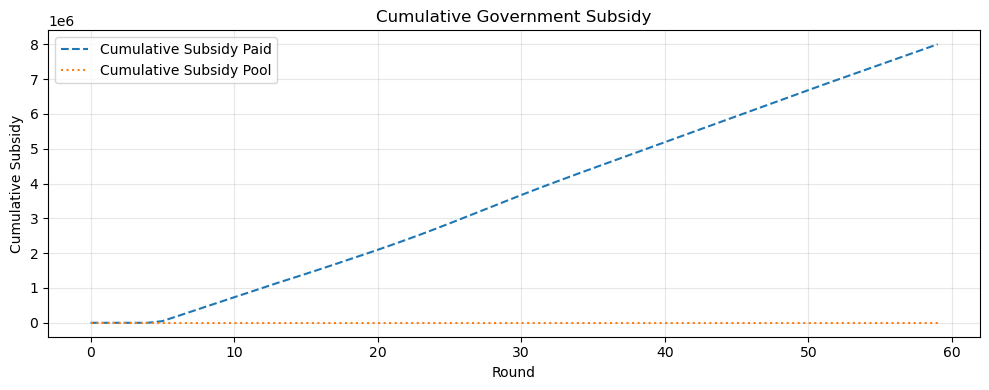

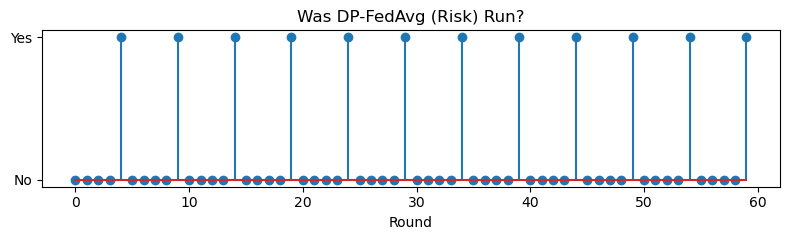

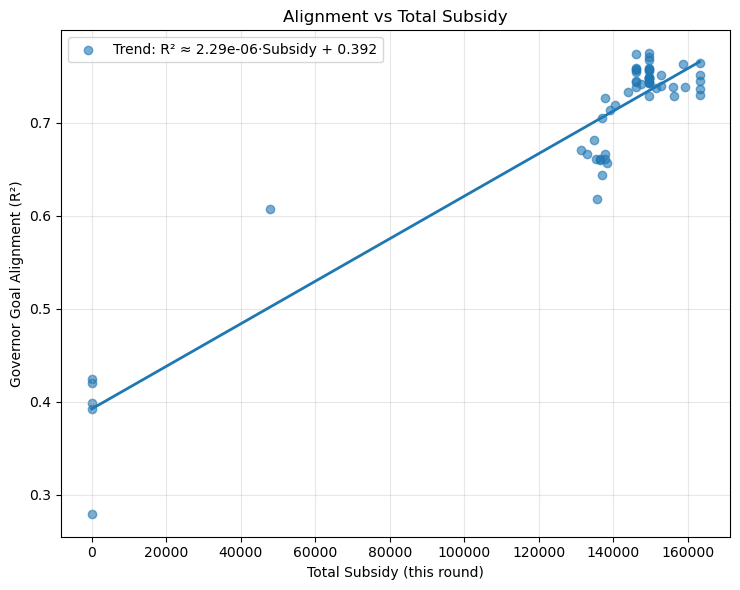

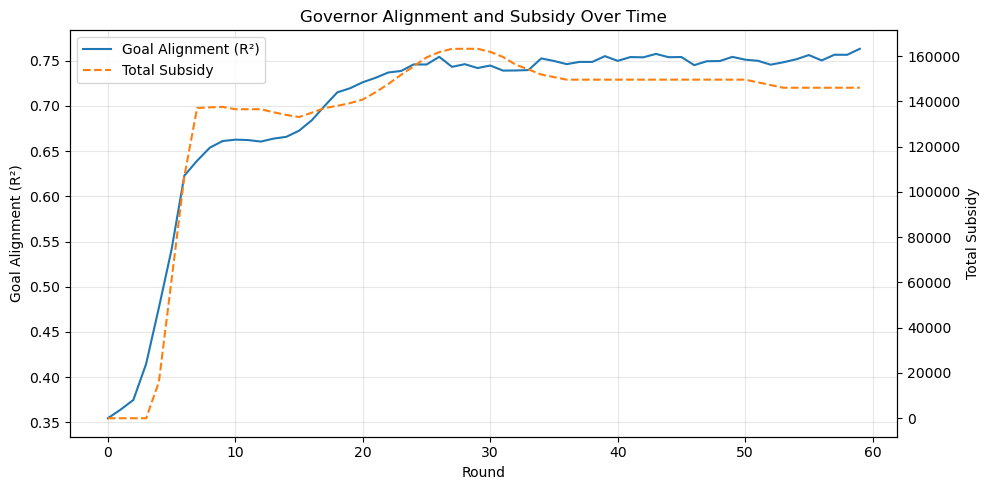

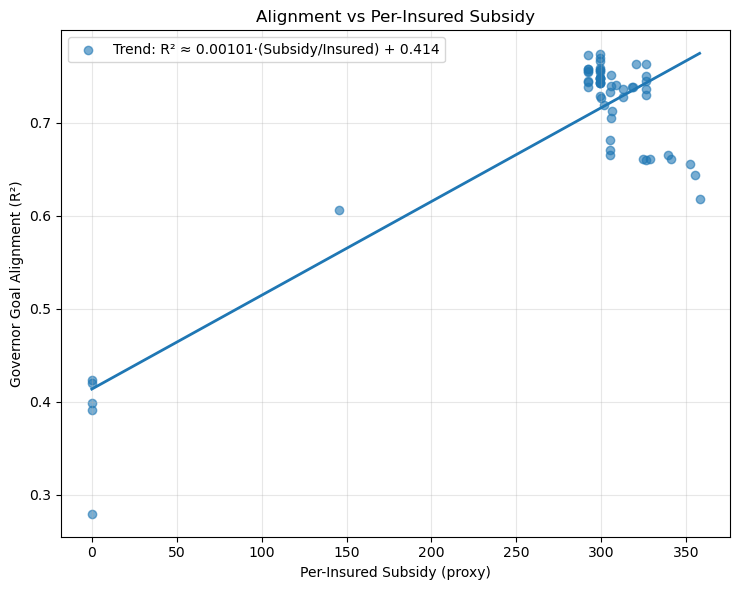

Correlation (R² vs total subsidy): 0.945078806019432
Correlation (R² vs subsidy per insured): 0.8627742812940776


In [15]:
# Build a small market
N = 500
patients = [Patient() for _ in range(N)]
insurers = [
    Insurance(0).set_attitude_profile('seeking'),
    Insurance(1).set_attitude_profile('averse'),
    Insurance(2).set_attitude_profile('neutral'),
    Insurance(3).set_attitude_profile('neutral'),
]
governor = Governor(feature_dim=5, hidden=32, lr=1e-1)

market = InsuranceMarket(
    patients=patients,
    insurers=insurers,
    governor=governor,
    initial_assign_pct=0.2,
    lock_in_rounds=5,
    cash_back_rate=0.15,
    fl_every_rounds=5,
    dp_sigma=0.05,
    clip_C=10.0 , force_step_pct=0.01 , coverage_target=1.0
)

history = []
for r in range(60):
    stats = market.run_round(round_id=r)
    history.append(stats)

plot_market_statistics(history, smooth=3)
plot_model_losses(history, smooth=3)
plot_risk_calibration(history)
plot_price_views(history, smooth=3)
plot_subsidy_efficiency(history, smooth=3)
plot_fl_aggregation_flags(history)
plot_governor_alignment_vs_subsidy(history, smooth=3, population_size=len(patients))

# effects of number of Insurances

In [24]:
# small market
N = 500
history_per_agents = []

for num_insurances in range(2 , 20):
    patients = [Patient() for _ in range(N)]
    insurers = []
    for i in range(num_insurances):
        insurers.append(Insurance(i , lr=1e-4 , imitation_weight=0.333).set_attitude_profile('neutral'))
    governor = Governor(feature_dim=5, hidden=32, lr=1e-3)

    market = InsuranceMarket(
        patients=patients,
        insurers=insurers,
        governor=governor,
        initial_assign_pct=0.2,
        lock_in_rounds=12,
        cash_back_rate=0.15,
        fl_every_rounds=12,
        dp_sigma=0.05,
        clip_C=10.0 , force_step_pct=0.001 , coverage_target=1.0
    )
    for r in range(120):
        stats = market.run_round(round_id=r)
        if r == 119:
            history_per_agents.append(stats)


In [33]:
import numpy as np

In [81]:
hist = np.array(history_per_agents)

In [79]:
import matplotlib.pyplot as plt
import seaborn as sns 
import pandas as pd 


In [135]:
hist[0]

{'round': 119,
 'insurer_stats': {0: {'market_share': 0.692,
   'avg_price': 210.47266798074534,
   'avg_coverage': 0.7498001907678835,
   'loss': 666.5421930906723,
   'premium_pre_voucher': 72823.54312133789,
   'claims_pre_voucher': 2092.4631199107716,
   'profit_pre_voucher': 70731.08000142712,
   'loss_ratio_pre_voucher': 0.028733333070931878,
   'market_share_final': 0.694,
   'premium_final': 73023.54312133789,
   'claims_final': 1921.2354512770582,
   'profit_final': 71102.30767006084,
   'loss_ratio_final': 0.026309808715864164},
  1: {'market_share': 0.42,
   'avg_price': 219.33590836297898,
   'avg_coverage': 0.8334928287927984,
   'loss': 706.8179567401386,
   'premium_pre_voucher': 46060.540756225586,
   'claims_pre_voucher': 913.683349029642,
   'profit_pre_voucher': 45146.857407195945,
   'loss_ratio_pre_voucher': 0.0198365745175527,
   'market_share_final': 0.42,
   'premium_final': 46060.540756225586,
   'claims_final': 1502.9796466584485,
   'profit_final': 44557.5611

In [132]:
total_market_share = []
for i in range(0 , 18):
    total_market = 0
    total_profit = 0
    avg_price = 0
    avg_coverage = 0
    loss = 0
    gov_sub_total = hist[i]['patient_outcomes']['gov_subsidy_total']
    gov_score = hist[i]['goal_score']
    agents_market_share = []
    for j in range(i+2):
        total_market+= hist[i]['insurer_stats'][j]['market_share_final']
        total_profit+= hist[i]['insurer_stats'][j]['profit_final']
        avg_price += hist[i]['insurer_stats'][j]['avg_price']
        avg_coverage += hist[i]['insurer_stats'][j]['avg_coverage']
        loss += hist[i]['insurer_stats'][j]['loss_ratio_pre_voucher']
        agents_market_share.append(hist[i]['insurer_stats'][j]['market_share'])
    total_market = np.min([1.0 , total_market])
    total_profit = total_profit/(i+2)
    avg_price = avg_price/(i+2)
    avg_coverage = avg_coverage/(i+2)
    loss = loss/(i+2)
    total_market_share.append([total_market , total_profit, avg_price, avg_coverage , loss , gov_sub_total , gov_score , agents_market_share])


In [133]:
df = pd.DataFrame(total_market_share)

In [134]:
df

,0,1,2,3,4,5,6,7
0,1.0,57829.934390,214.904288,0.791647,0.024285,37400.000000,0.755719,"[0.692, 0.42]"
1,1.0,40406.694270,212.821692,0.754434,0.027067,35419.311249,0.781358,"[0.64, 0.436, 0.068]"
2,1.0,31576.821220,212.192583,0.654560,0.019755,34200.000000,0.791194,"[0.748, 0.076, 0.018, 0.334]"
3,1.0,22658.372541,213.847450,0.835043,0.024263,32200.000000,0.772777,"[0.492, 0.082, 0.144, 0.134, 0.246]"
4,1.0,20505.297177,208.748622,0.552893,0.015124,33200.000000,0.813210,"[0.28, 0.426, 0.032, 0.016, 0.392, 0.008]"
5,1.0,17471.672727,210.074964,0.632806,0.016736,35400.000000,0.734991,"[0.392, 0.08, 0.02, 0.31, 0.018, 0.304, 0.014]"
6,1.0,14283.212564,208.359507,0.668599,0.022514,32000.000000,0.779894,"[0.298, 0.034, 0.178, 0.02, 0.126, 0.246, 0.18..."
7,1.0,13780.881398,207.916639,0.535068,0.007807,33200.000000,0.804388,"[0.29, 0.064, 0.002, 0.322, 0.006, 0.422, 0.01..."
8,1.0,11607.004125,207.307967,0.521549,0.010990,34800.000000,0.777671,"[0.32, 0.04, 0.258, 0.01, 0.234, 0.006, 0.216,..."
9,1.0,10323.396731,210.851167,0.590877,0.012193,37200.000000,0.777348,"[0.412, 0.044, 0.212, 0.01, 0.04, 0.008, 0.006..."


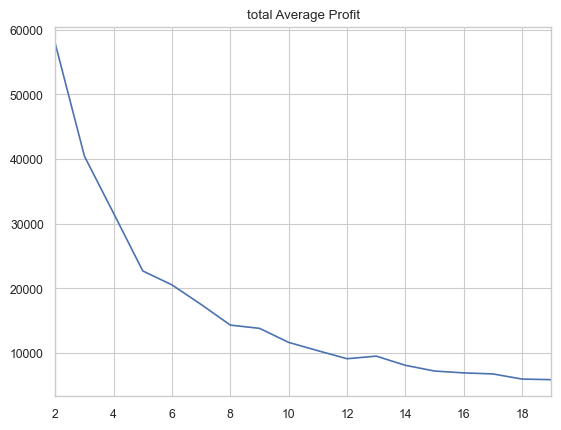

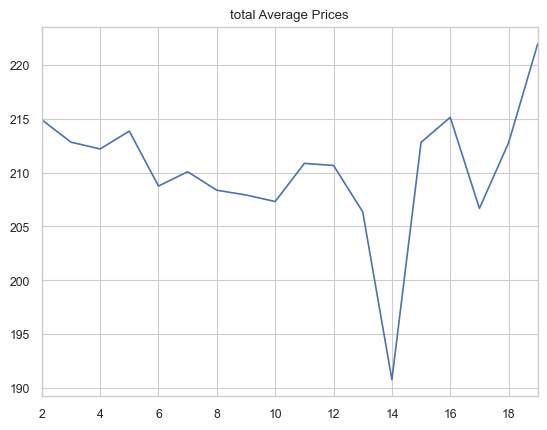

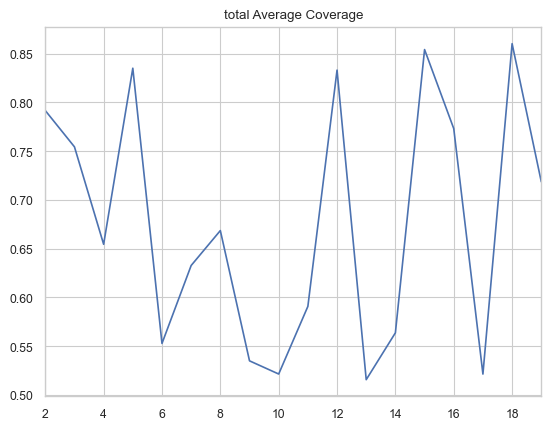

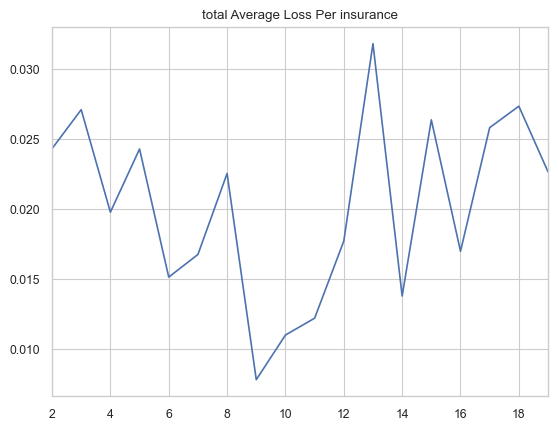

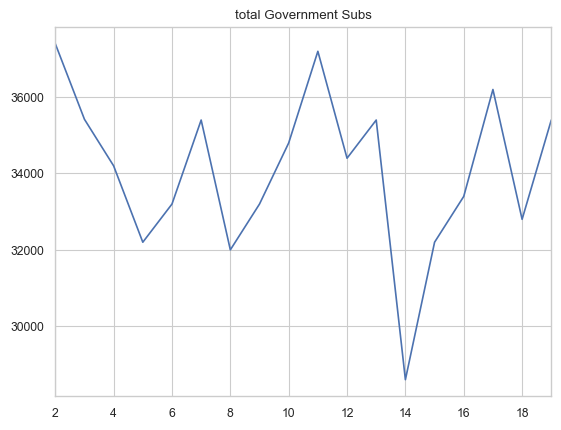

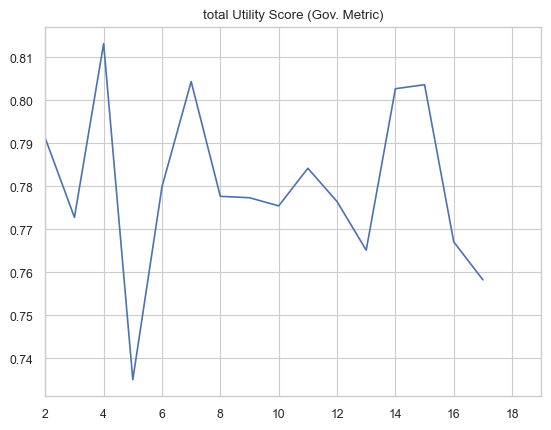

In [146]:
plt.plot(np.arange(2 , 20) ,df.iloc[: , 1])
plt.title("total Average Profit")
plt.xlim([2 , 19])
plt.grid(True)
sns.set_theme('paper')
sns.set_style('whitegrid')
plt.show()
plt.plot(np.arange(2 , 20) ,df.iloc[: , 2])
plt.title("total Average Prices")
plt.xlim([2 , 19])
plt.grid(True)
sns.set_theme('paper')
sns.set_style('whitegrid')
plt.show()
plt.plot(np.arange(2 , 20) ,df.iloc[: , 3])
plt.title("total Average Coverage")
plt.xlim([2 , 19])
plt.grid(True)
sns.set_theme('paper')
sns.set_style('whitegrid')
plt.show()
plt.plot(np.arange(2 , 20) ,df.iloc[: , 4])
plt.title("total Average Loss Per insurance")
plt.xlim([2 , 19])
plt.grid(True)
sns.set_theme('paper')
sns.set_style('whitegrid')
plt.show()
plt.plot(np.arange(2 , 20) ,df.iloc[: , 5])
plt.title("total Government Subs")
plt.xlim([2 , 19])
plt.grid(True)
sns.set_theme('paper')
sns.set_style('whitegrid')
plt.show()
plt.plot(df.iloc[: , 6])
plt.title("total Utility Score (Gov. Metric)")
plt.xlim([2 , 19])
plt.grid(True)
sns.set_theme('paper')
sns.set_style('whitegrid')
plt.show()

In [89]:
hist_df = pd.DataFrame(hist)
hist_df.to_csv('per-agent-results.csv')

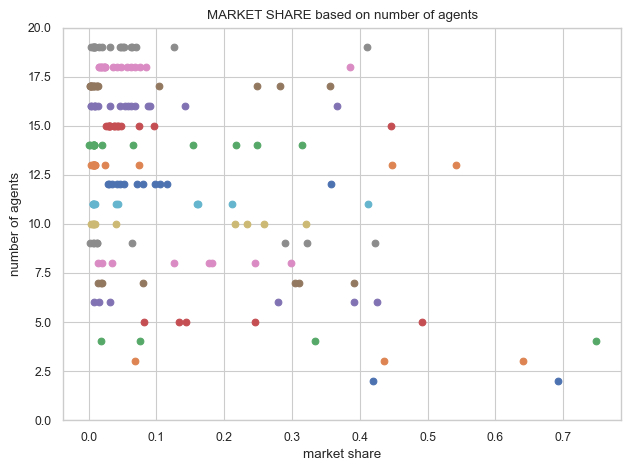

In [190]:
sns.set_theme('paper')
sns.set_style('whitegrid')
for i in range(2 , 20):
    plt.scatter(df.iloc[i-2 , -1] , i*np.ones(i) , )
plt.title("MARKET SHARE based on number of agents")
plt.ylabel('number of agents')
plt.xlabel('market share')
plt.ylim([0 , 20])
plt.grid(True)
plt.tight_layout()


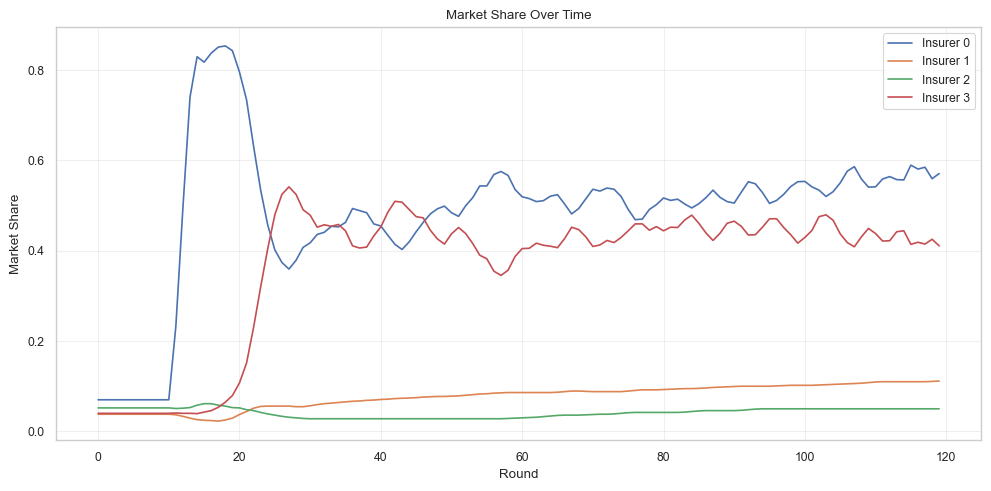

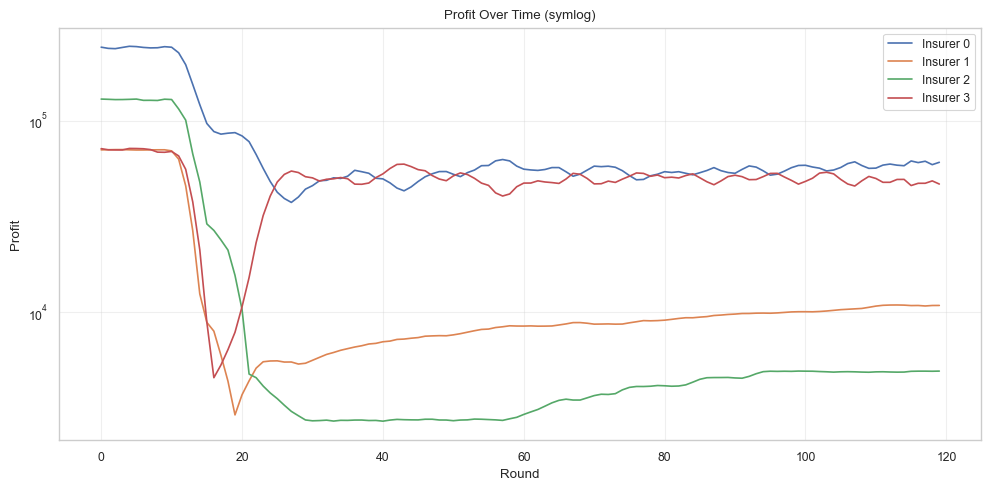

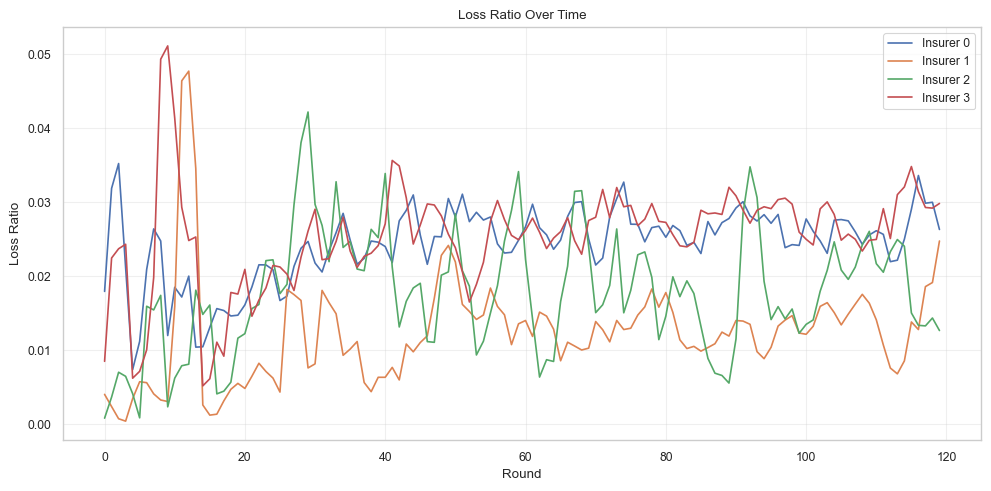

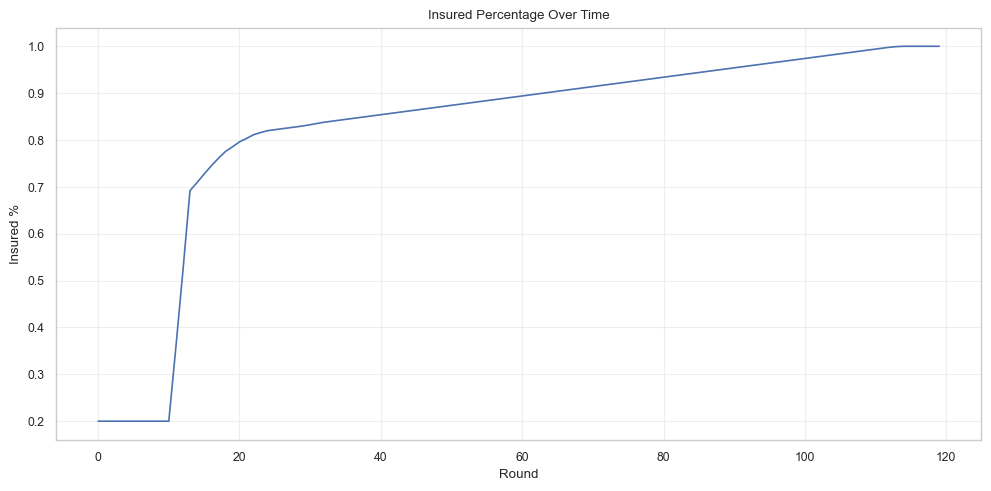

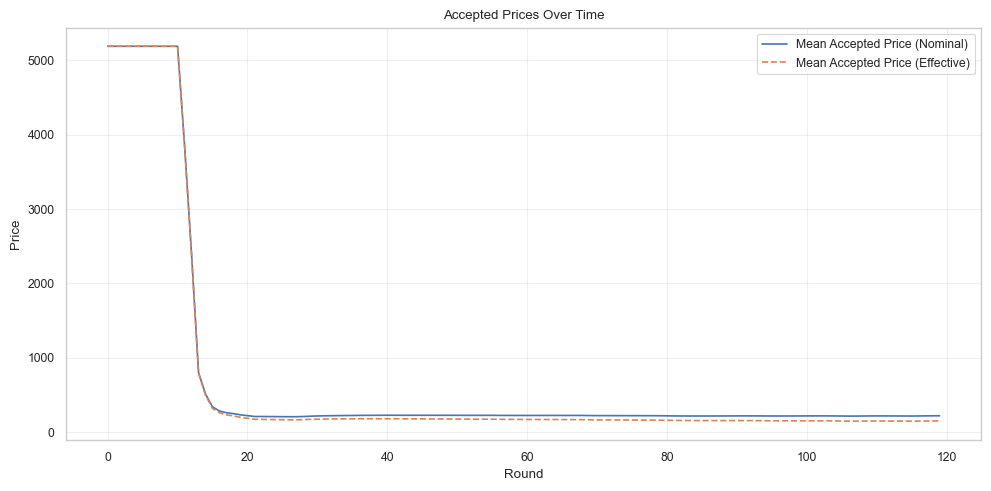

...

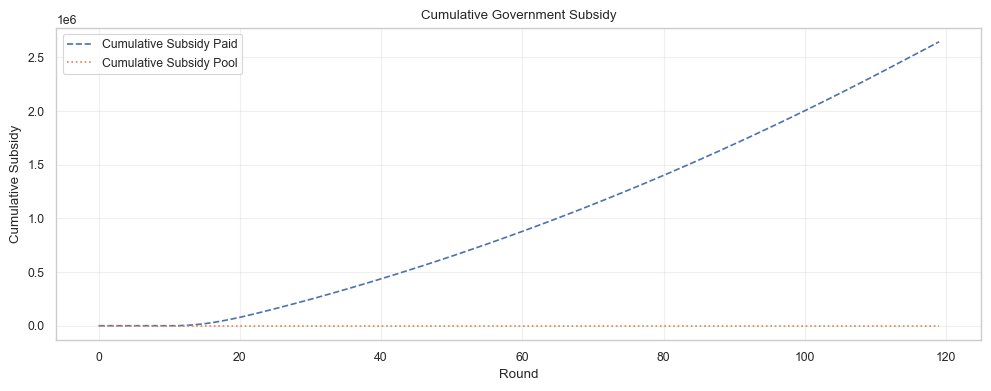

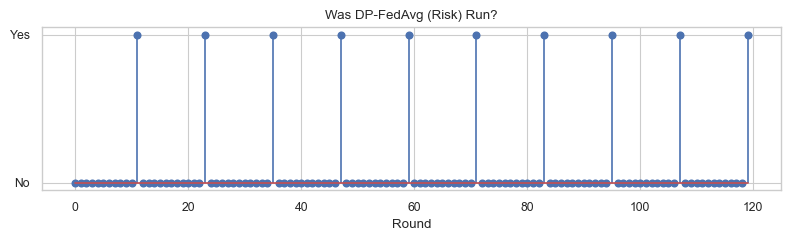

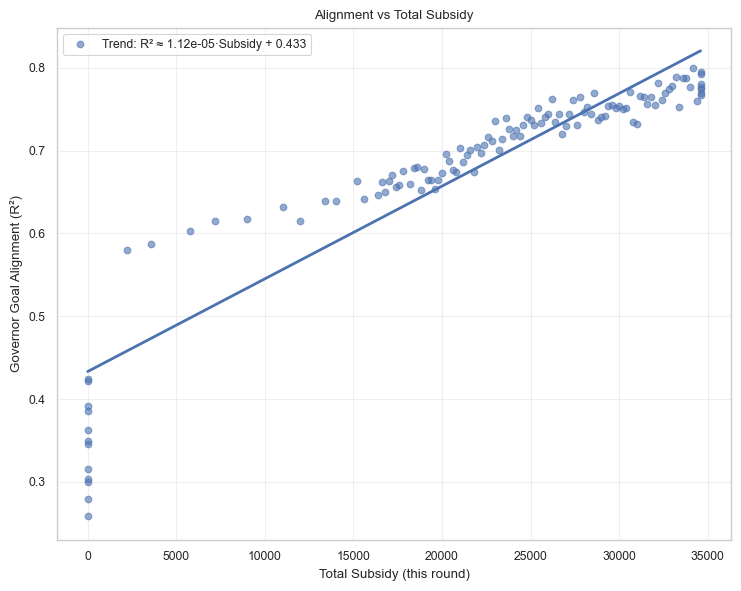

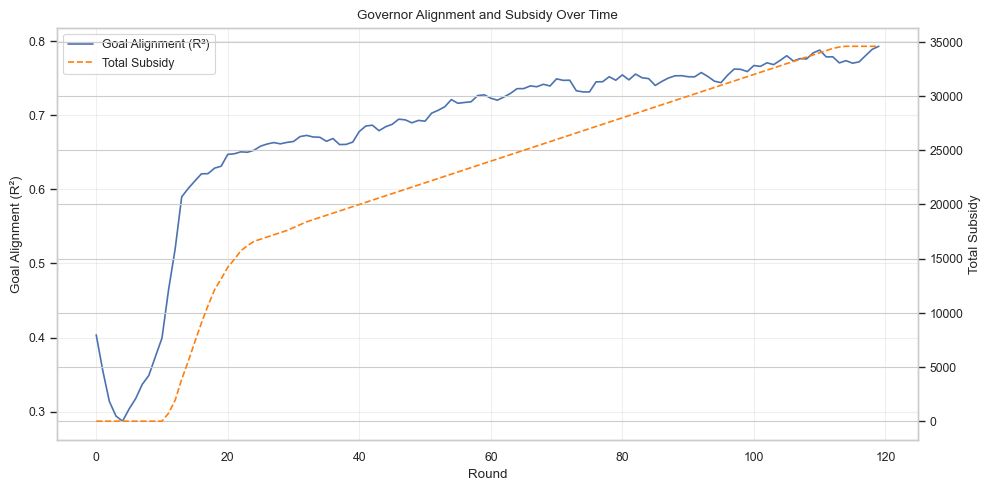

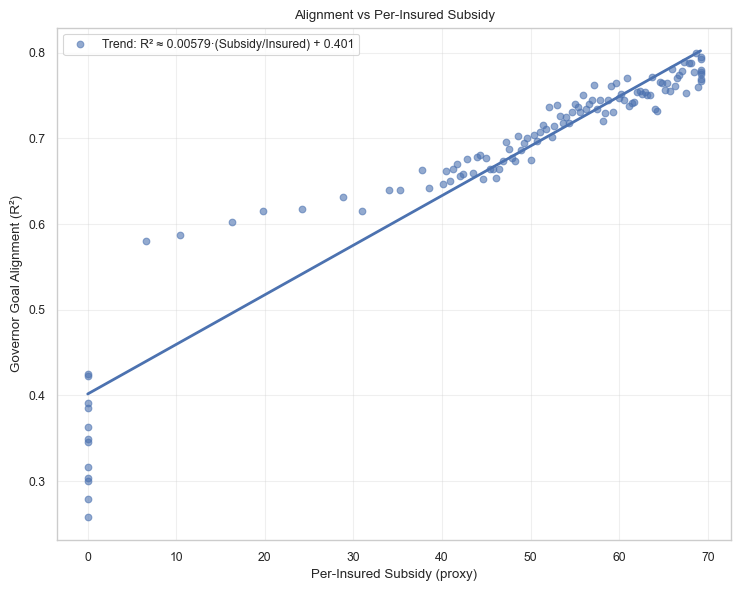

Correlation (R² vs total subsidy): 0.9217057527331202
Correlation (R² vs subsidy per insured): 0.9509077854340199


In [191]:
patients = [Patient() for _ in range(N)]
insurers = []
for i in range(4):
    insurers.append(Insurance(i , lr=1e-4 , imitation_weight=0.333).set_attitude_profile('neutral'))
governor = Governor(feature_dim=5, hidden=32, lr=1e-3)

market = InsuranceMarket(
        patients=patients,
        insurers=insurers,
        governor=governor,
        initial_assign_pct=0.2,
        lock_in_rounds=12,
        cash_back_rate=0.15,
        fl_every_rounds=12,
        dp_sigma=0.05,
        clip_C=10.0 , force_step_pct=0.001 , coverage_target=1.0
)
history = []
for r in range(120):
    stats = market.run_round(round_id=r)
    history.append(stats)

plot_market_statistics(history, smooth=3)
plot_model_losses(history, smooth=3)
plot_risk_calibration(history)
plot_price_views(history, smooth=3)
plot_subsidy_efficiency(history, smooth=3)
plot_fl_aggregation_flags(history)
plot_governor_alignment_vs_subsidy(history, smooth=3, population_size=len(patients))

## Robustness to patient distribution change

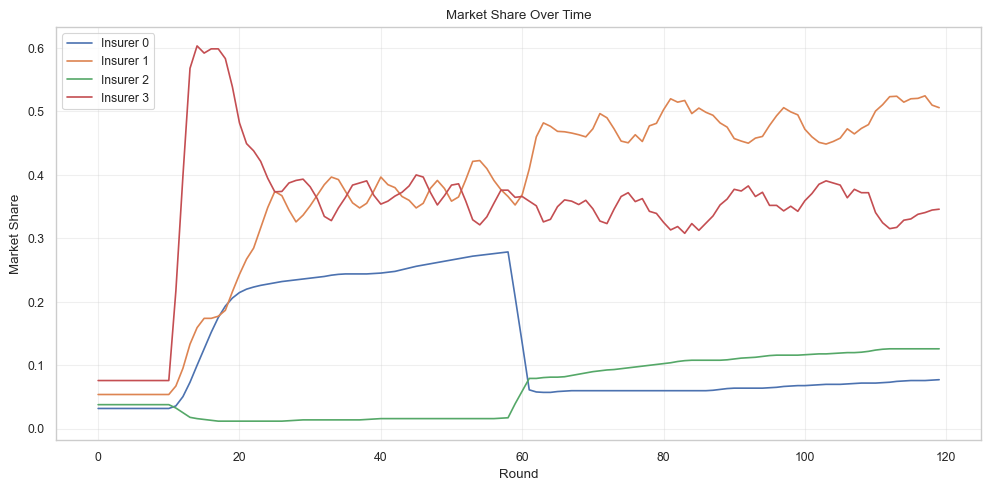

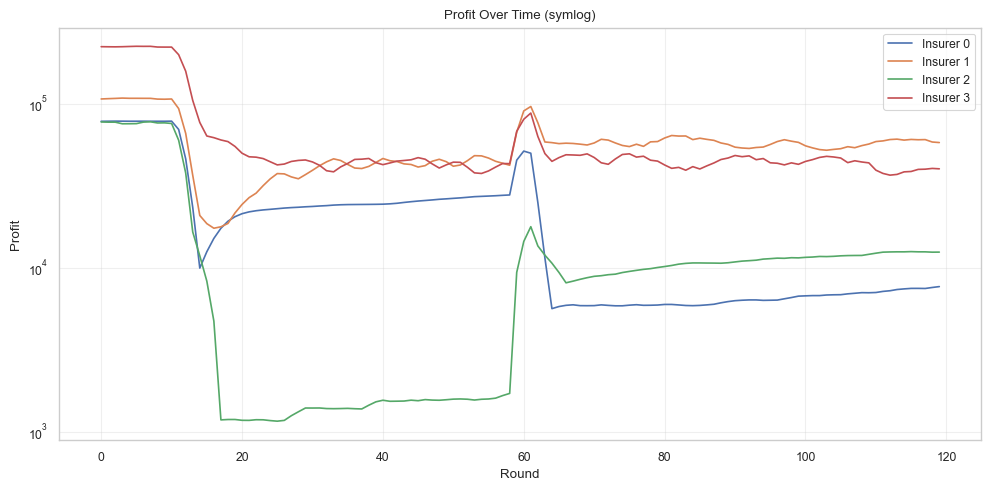

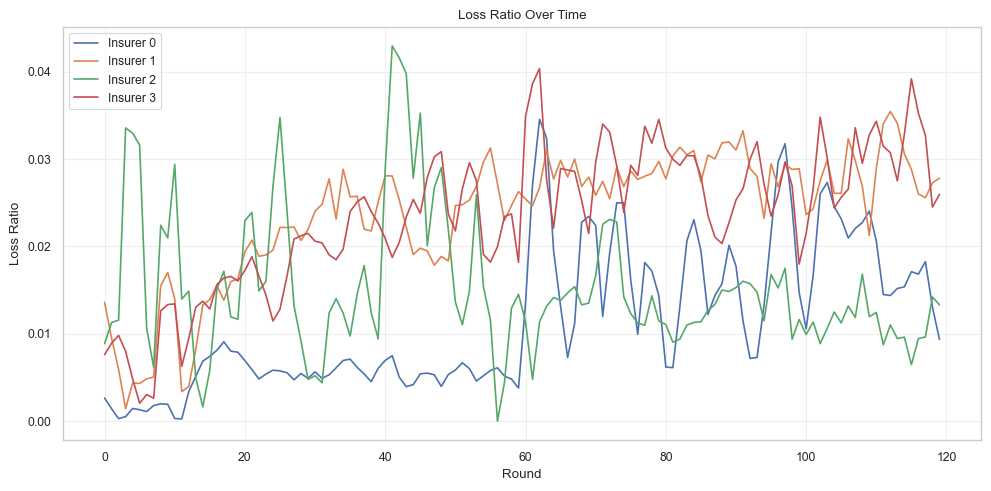

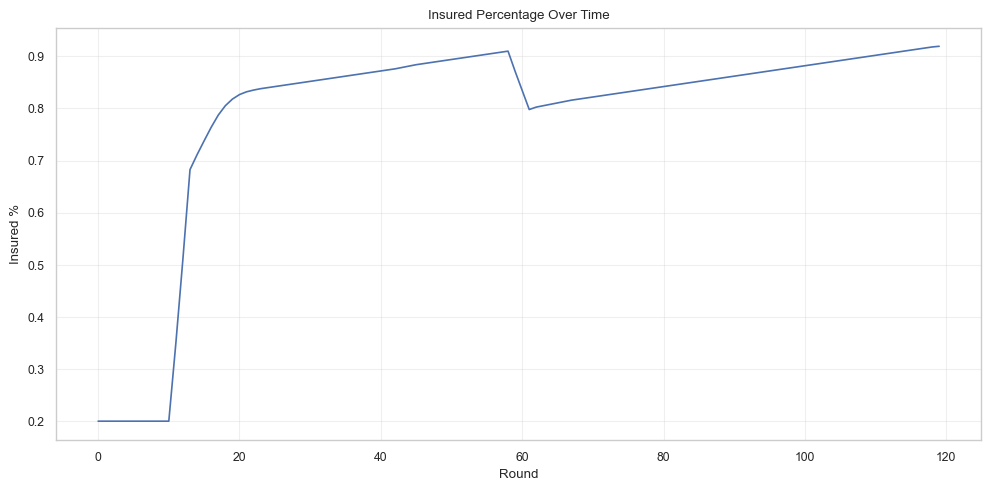

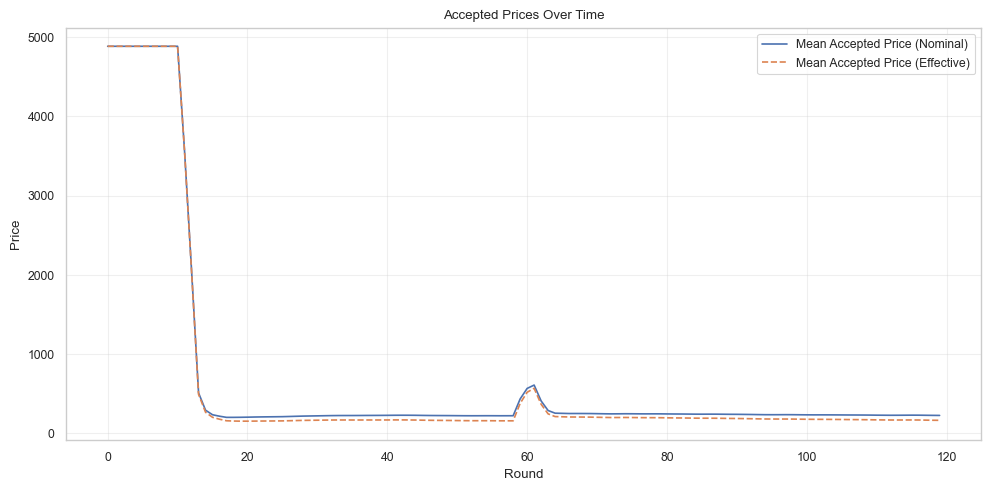

...

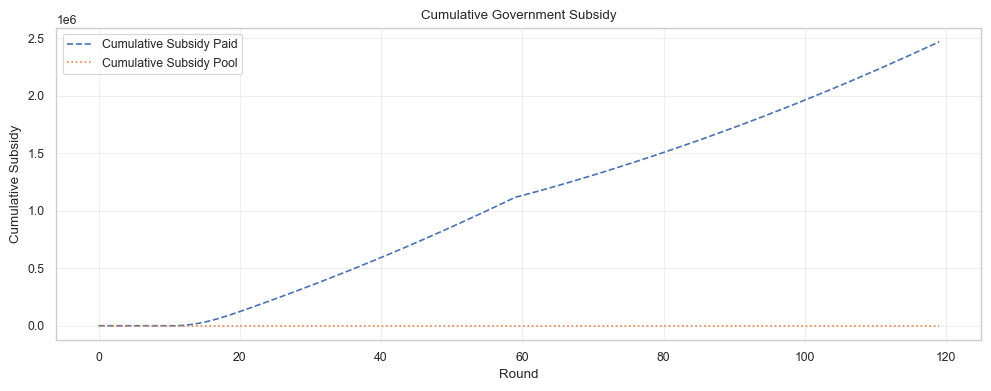

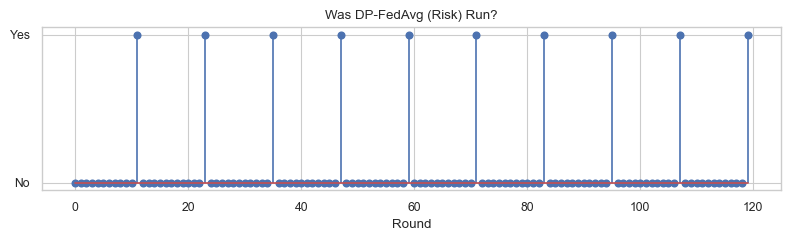

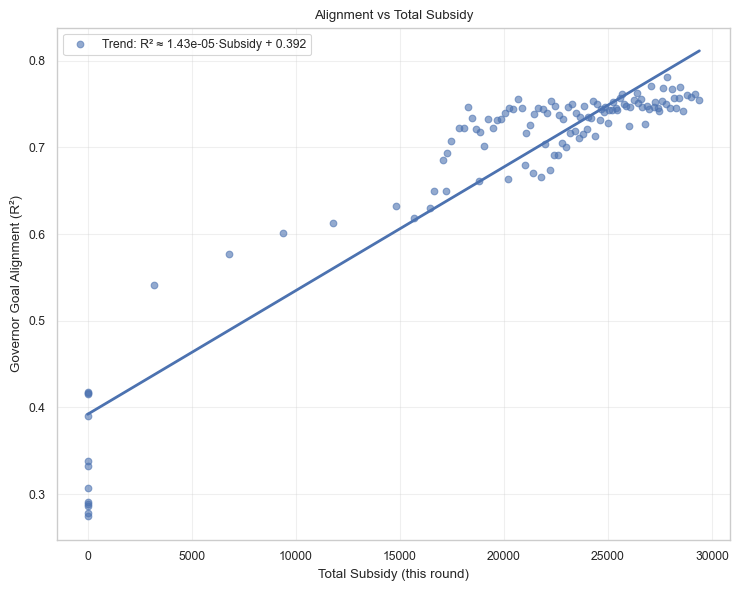

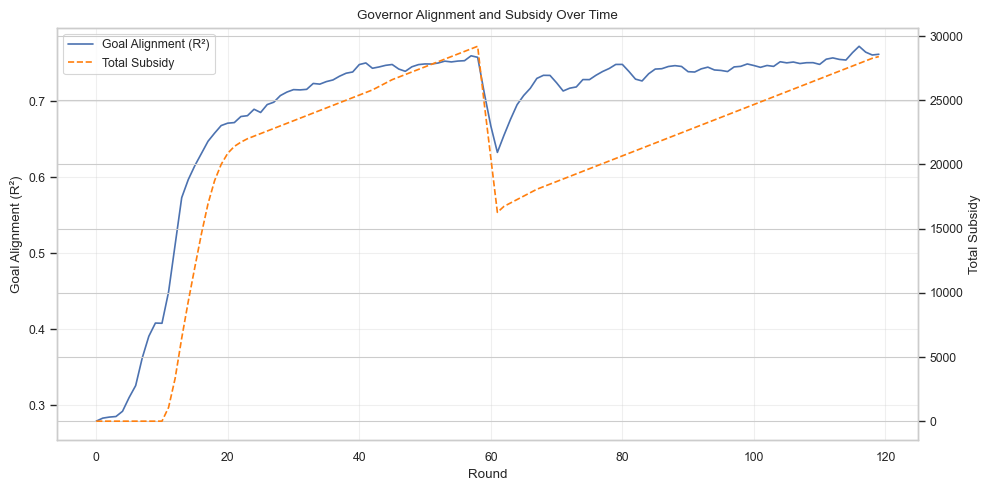

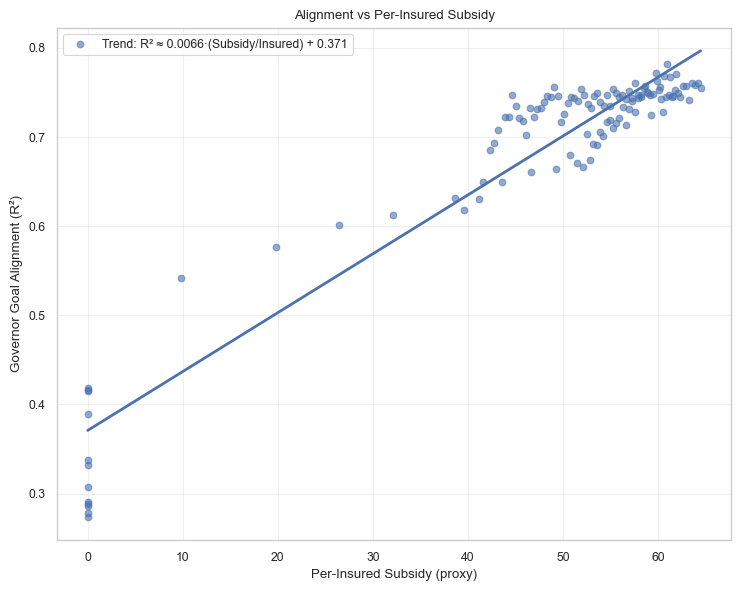

Correlation (R² vs total subsidy): 0.9332503217663932
Correlation (R² vs subsidy per insured): 0.9522396167022473


In [193]:
patients = [Patient() for _ in range(N)]
insurers = []
for i in range(4):
    insurers.append(Insurance(i , lr=1e-4 , imitation_weight=0.333).set_attitude_profile('neutral'))
governor = Governor(feature_dim=5, hidden=32, lr=1e-3)

market = InsuranceMarket(
        patients=patients,
        insurers=insurers,
        governor=governor,
        initial_assign_pct=0.2,
        lock_in_rounds=12,
        cash_back_rate=0.15,
        fl_every_rounds=12,
        dp_sigma=0.05,
        clip_C=10.0 , force_step_pct=0.001 , coverage_target=1.0
)
history = []
for r in range(120):
    if r == 60:
        patients = [Patient() for _ in range(N)]
        market = InsuranceMarket(
        patients=patients,
        insurers=insurers,
        governor=governor,
        initial_assign_pct=0.2,
        lock_in_rounds=12,
        cash_back_rate=0.15,
        fl_every_rounds=12,
        dp_sigma=0.05,
        clip_C=10.0 , force_step_pct=0.001 , coverage_target=1.0
        )
    stats = market.run_round(round_id=r)
    history.append(stats)

plot_market_statistics(history, smooth=3)
plot_model_losses(history, smooth=3)
plot_risk_calibration(history)
plot_price_views(history, smooth=3)
plot_subsidy_efficiency(history, smooth=3)
plot_fl_aggregation_flags(history)
plot_governor_alignment_vs_subsidy(history, smooth=3, population_size=len(patients))

## Robustness to Insurance and patient market change

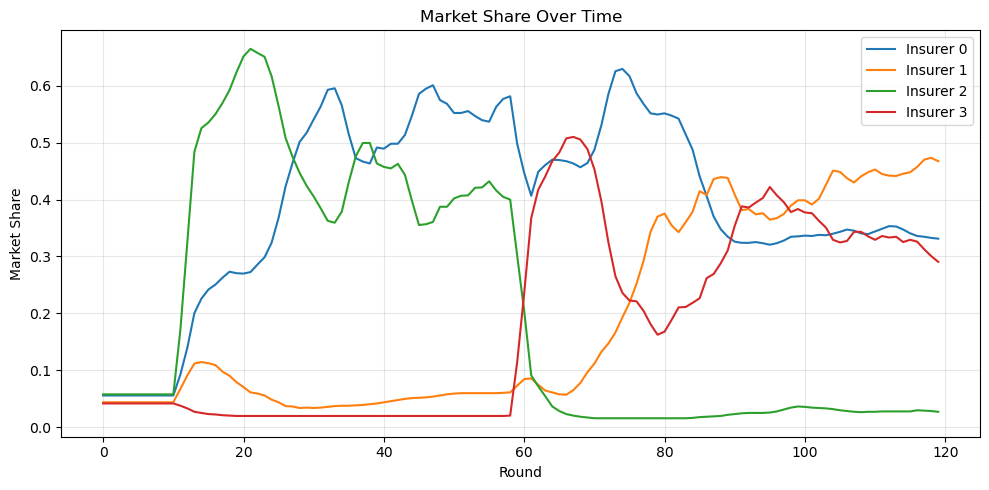

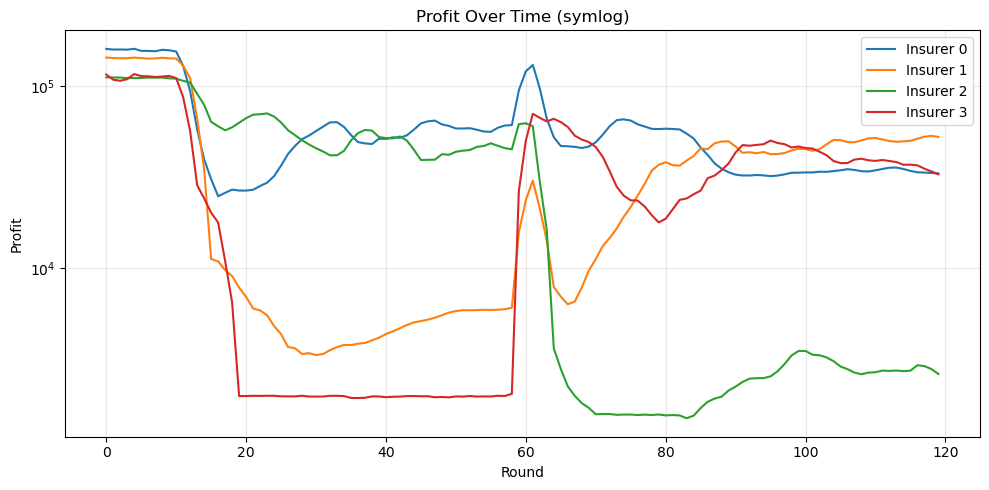

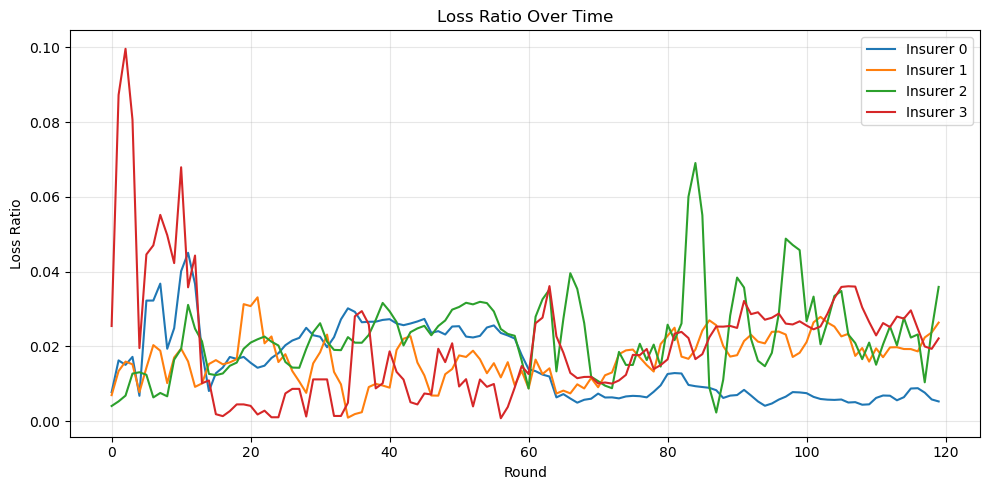

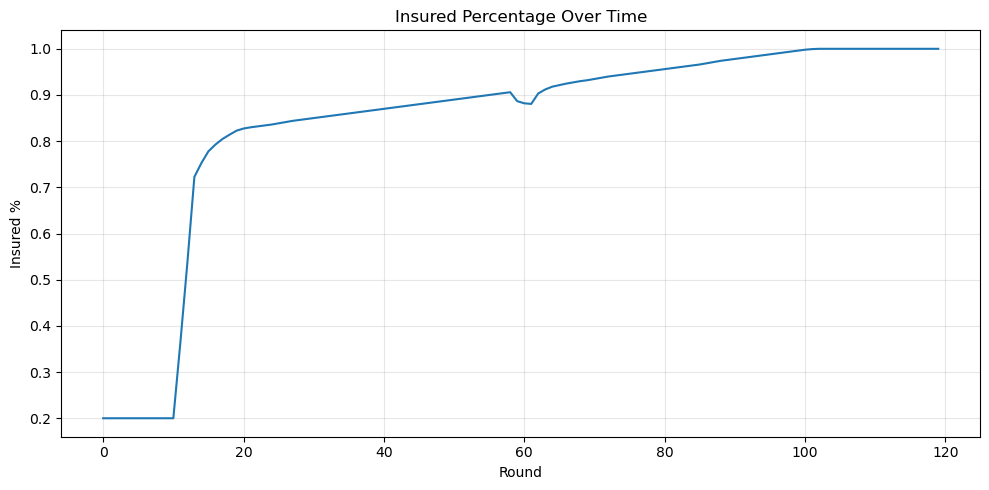

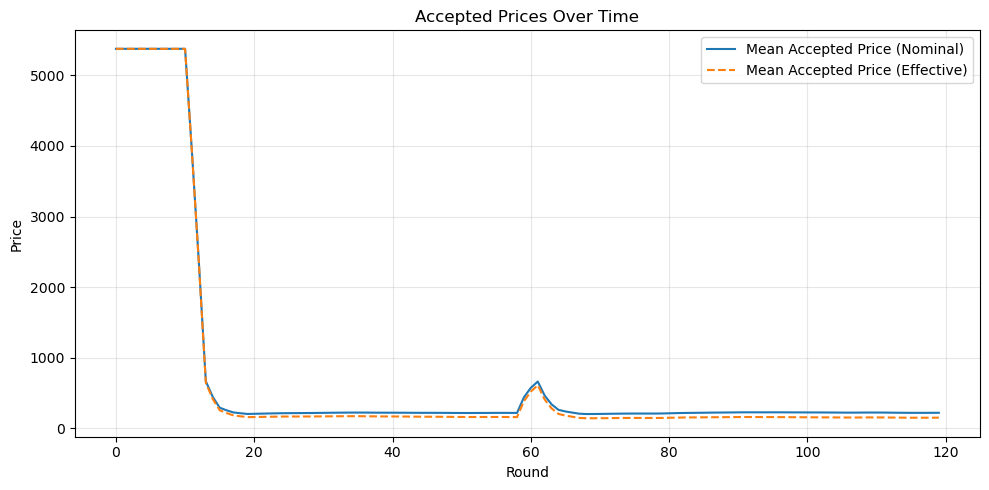

...

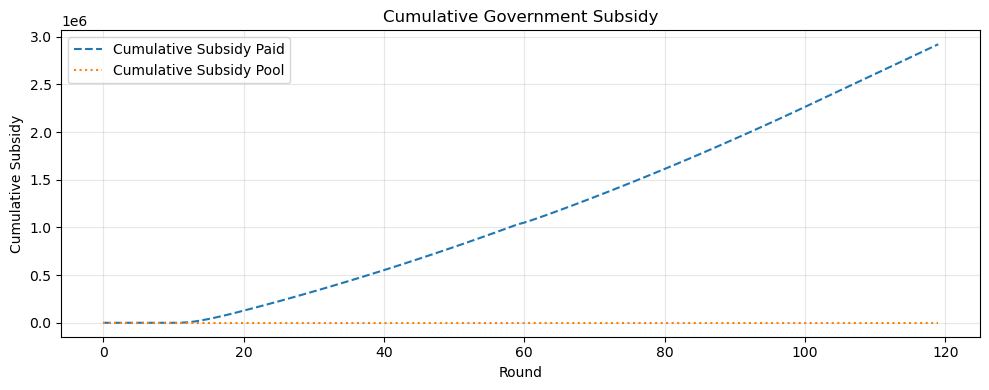

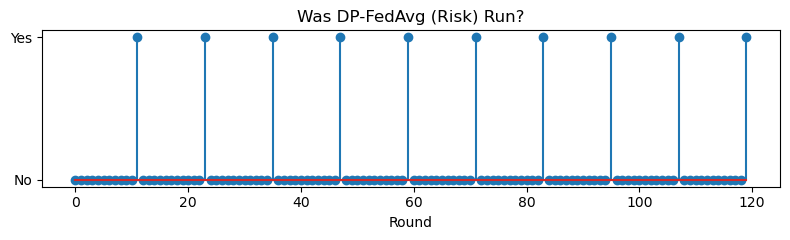

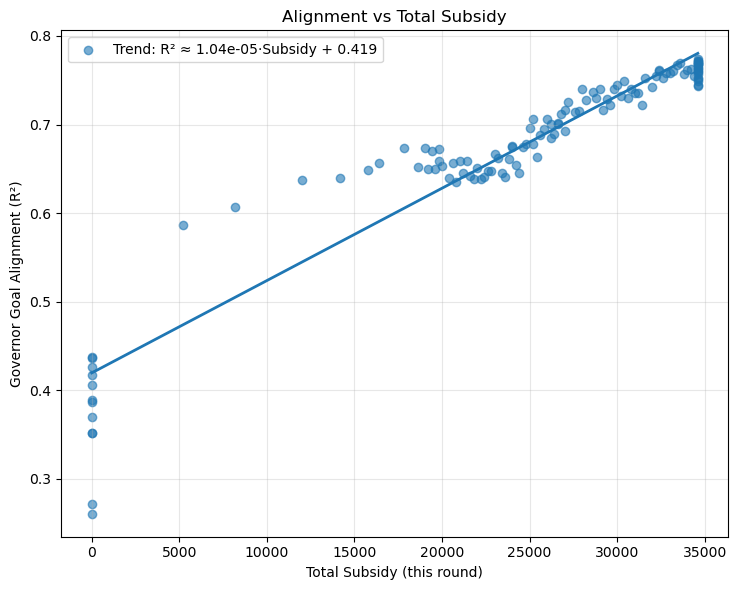

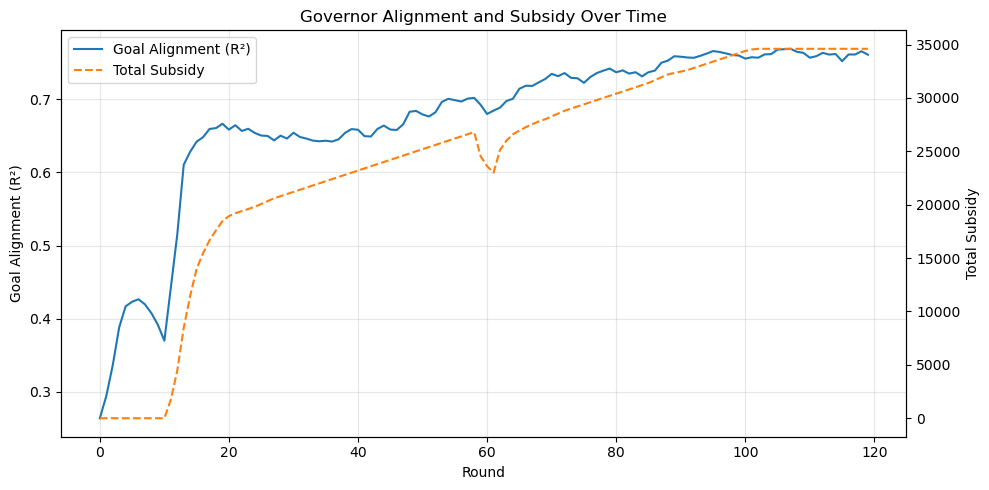

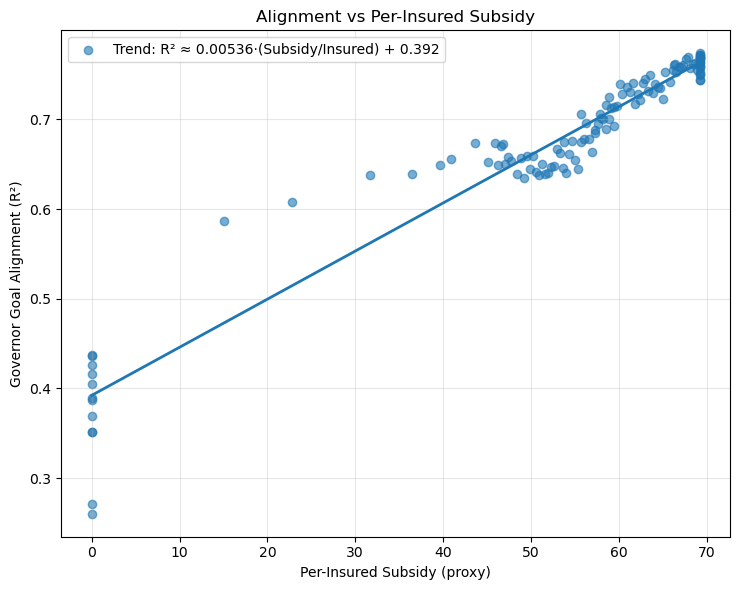

Correlation (R² vs total subsidy): 0.9498234731947319
Correlation (R² vs subsidy per insured): 0.9644568316481476


In [12]:
patients = [Patient() for _ in range(N)]
insurers = []
for i in range(4):
    insurers.append(Insurance(i , lr=1e-4 , imitation_weight=0.333).set_attitude_profile('neutral'))
governor = Governor(feature_dim=5, hidden=32, lr=1e-3)

market = InsuranceMarket(
        patients=patients,
        insurers=insurers,
        governor=governor,
        initial_assign_pct=0.2,
        lock_in_rounds=12,
        cash_back_rate=0.15,
        fl_every_rounds=12,
        dp_sigma=0.05,
        clip_C=10.0 , force_step_pct=0.001 , coverage_target=1.0
)
history = []
for r in range(120):
    if r==60:
        patients = [Patient() for _ in range(N)]
        insurers = []
        for i in range(4):
            insurers.append(Insurance(i , lr=1e-4 , imitation_weight=0.5 , risk_load_cov=0.1).set_attitude_profile('neutral'))
        
        market = InsuranceMarket(
        patients=patients,
        insurers=insurers,
        governor=governor,
        initial_assign_pct=0.2,
        lock_in_rounds=12,
        cash_back_rate=0.15,
        fl_every_rounds=12,
        dp_sigma=0.05,
        clip_C=10.0 , force_step_pct=0.001 , coverage_target=1.0
        )
    stats = market.run_round(round_id=r)
    history.append(stats)

plot_market_statistics(history, smooth=3)
plot_model_losses(history, smooth=3)
plot_risk_calibration(history)
plot_price_views(history, smooth=3)
plot_subsidy_efficiency(history, smooth=3)
plot_fl_aggregation_flags(history)
plot_governor_alignment_vs_subsidy(history, smooth=3, population_size=len(patients))